# CNN-RNN Model Training, Dependent Labels
## Author: Ian Scarff (iie728)

In [1]:
import pandas as pd
import numpy as np
import json
import os
import imageio
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MultiLabelBinarizer
import time
import datetime

import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torchvision
import torch.nn.functional as F
from torchvision import transforms
from torchvision import models
from torch.utils.data import DataLoader, SubsetRandomSampler
from sklearn.model_selection import KFold
import skimage

from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

import warnings
warnings.filterwarnings('ignore')

## Setup

In [2]:
classes = ['Smears', 'Loaded Language', 'Name calling/Labeling', 'Glittering generalities (Virtue)',
               'Appeal to (Strong) Emotions', 'Appeal to fear/prejudice', 'Transfer', 'Doubt',
               'Exaggeration/Minimisation', 'Whataboutism', 'Slogans', 'Flag-waving',
               "Misrepresentation of Someone's Position (Straw Man)", 'Causal Oversimplification',
               'Thought-terminating cliché', 'Black-and-white Fallacy/Dictatorship', 'Appeal to authority',
               'Reductio ad hitlerum', 'Repetition', 'Obfuscation, Intentional vagueness, Confusion',
               'Presenting Irrelevant Data (Red Herring)', 'Bandwagon']

### Create Class Binarizer
one_hot = MultiLabelBinarizer()
one_hot.fit([classes])

MultiLabelBinarizer()

In [3]:
from CustomLoader import ImageLoader

In [4]:
training_data = ImageLoader(json_file = 'training_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

testing_data = ImageLoader(json_file = 'testing_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

In [5]:
train_loader = DataLoader(dataset = training_data, batch_size = 25, shuffle = True)
test_loader = DataLoader(dataset = testing_data, batch_size = 25, shuffle = True)

# 
# 

## Define CNN-RNN Architectures (Set Hidden Size)

### ResNet18-LSTM

In [6]:
### Define Class
class ResNet18_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet18_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet18 = models.resnet18(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet18.fc.in_features
        
        ### Freeze Parameters
        for param in resnet18.parameters():
            param.requires_grad = False
            
        ### CNN Encoder, remove prediction layer
        self.cnn = nn.Sequential(*list(resnet18.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet50-LSTM

In [7]:
### Define Class
class ResNet50_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet50_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet50 = models.resnet50(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet50.fc.in_features
        
        for param in resnet50.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet50.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)    
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet101-LSTM

In [8]:
### Define Class
class ResNet101_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet101_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet101 = models.resnet101(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet101.fc.in_features
        
        for param in resnet101.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet101.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet121-LSTM

In [9]:
### Define Class
class DenseNet121_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet121_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet121 = models.densenet121(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 50176 # densenet121.classifier.in_features
        
        for param in densenet121.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet121.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
#         self.cnn_output_size = image_emb.shape[0]
        
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)

        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet169-LSTM

In [10]:
### Define Class
class DenseNet169_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet169_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet169 = models.densenet169(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 81536 # densenet169.classifier.in_features
        
        for param in densenet169.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet169.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
           
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet201-LSTM

In [11]:
### Define Class
class DenseNet201_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet201_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
               
        
        ### Import DenseNet101
        densenet201 = models.densenet201(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 94080 #densenet201.classifier.in_features
        
        
        for param in densenet201.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet201.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        
        image_emb = torch.flatten(image_emb, 1)
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG11_BN-LSTM

In [12]:
### Define Class
class VGG11_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG11_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg11bn = models.vgg11_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg11bn.classifier[6].in_features
        
       
        for param in vgg11bn.parameters():
            param.requires_grad = False

        
        vgg11bn.classifier = nn.Sequential(*list(vgg11bn.classifier.children())[:-1])
        
            
        ### CNN Encoder
        self.cnn = vgg11bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG16_BN-LSTM

In [13]:
### Define Class
class VGG16_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG16_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg16bn = models.vgg16_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg16bn.classifier[6].in_features
        
        for param in vgg16bn.parameters():
            param.requires_grad = False

        
        vgg16bn.classifier = nn.Sequential(*list(vgg16bn.classifier.children())[:-1])

            
        ### CNN Encoder
        self.cnn = vgg16bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG19_BN-LSTM

In [14]:
### Define Class
class VGG19_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG19_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg19bn = models.vgg19_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg19bn.classifier[6].in_features
        
        for param in vgg19bn.parameters():
            param.requires_grad = False

        
        vgg19bn.classifier = nn.Sequential(*list(vgg19bn.classifier.children())[:-1])
            
        ### CNN Encoder
        self.cnn = vgg19bn
        
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

# 
# 
# 

## Define Training Methodology

In [15]:
def get_lr(optim):
    for param_group in optim.param_groups:
        return param_group['lr']

In [16]:
### This function is used to train a cnn model
def Kfold_train_CNN_RNN(model = None, training_data = None, learning_rate = None, k_folds = None, n_epochs = None, model_name = None):
    
    ### Check that all entries are valid
    if ((model == None) or (training_data == None) or (model_name == None) or 
        (learning_rate == None) or (k_folds == None) or (n_epochs == None)):
        print ('Enter all info.')
        
        
        
    ### Run K-Fold CV
    else:
        
        device = 'cpu'

        ### Set Loss Function and Optimizer
        criterion = nn.BCELoss()
        
        
        #### Define the K-fold Cross Validator
        kfold = KFold(n_splits=k_folds, shuffle=True)
        
        
        
        ### Create values to hold the best model metrics across folds
        val_f1_mic_max = 0 ### This determines best model
        
        best_train_loss = 0
        best_train_acc = 0
        best_train_f1_mic = 0
        best_train_f1_mac = 0
        best_train_prec_mic = 0
        best_train_prec_mac = 0
        best_train_rec_mic = 0
        best_train_rec_mac = 0

        best_val_acc = 0
        best_val_loss = 0
#         best_val_f1_mic = 0
        best_val_f1_mac = 0
        best_val_prec_mic = 0
        best_val_prec_mac = 0
        best_val_rec_mic = 0
        best_val_rec_mac = 0
        
        best_fold = 0
        best_epoch = 0
        

        
        ### Start print

        start = time.time()
        
        ### K-fold Cross Validation model evaluation
        for fold, (train_ids, val_ids) in enumerate(kfold.split(training_data)):
            
            print('-------------------------------------------')
            print('FOLD {}'.format(fold + 1))
            print('-------------------------------------------')
            
            ### Sample elements randomly from a given list of ids, no replacement
            train_subsampler = SubsetRandomSampler(train_ids)
            val_subsampler = SubsetRandomSampler(val_ids)
            
            ### Define data loaders for training and validation in current fold
            train_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = train_subsampler)
            val_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = val_subsampler)
            
            ### Initialize network
            network = model
            if torch.cuda.is_available():
                network.cuda()
                network = nn.DataParallel(network, list(range(2)))
                device = 'cuda'
            
            ### Initialize optimizer
            optimizer = optim.Adam(model.parameters(), lr=learning_rate)
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.1, patience = 5)
            
            
            ### Create lists of values at the end of each epoch for each fold
            train_loss = []
            train_acc = []
            train_f1_mic = []
            train_f1_mac = []
            train_prec_mic = []
            train_prec_mac = []
            train_rec_mic = []
            train_rec_mac = []
            
            val_loss = []
            val_acc = []
            val_f1_mic = []
            val_f1_mac = []
            val_prec_mic = []
            val_prec_mac = []
            val_rec_mic = []
            val_rec_mac = []
            
            
            ### Train network
            for epoch in range(n_epochs):
                
                ### Hold training predictions and targets
                train_output = np.empty((0,22), int)
                train_all_targets = np.empty((0,22), int)
                
                val_output = np.empty((0,22), int)
                val_all_targets = np.empty((0,22), int)
                
                
                ### Train ###
                network.train()
                
                train_running_loss = 0.0
                
                batch_number = 0
                for i, data in enumerate(train_loader):
                    
                    images, targets = data[0].to(device), data[1].float().to(device)
                    optimizer.zero_grad()
                    
                    output = network(images)
                    
                    loss = criterion(output, targets) 
                    train_running_loss += loss.item()
                                        
                    ### Append output
                    train_output = np.vstack((train_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    train_all_targets = np.vstack((train_all_targets, targets.cpu().numpy().astype('int')))

                    loss.backward()
                    optimizer.step()
                                        
                    
                ### Calculate metrics and append
                train_loss.append(train_running_loss/len(train_loader.dataset))
                train_acc.append(accuracy_score(train_all_targets, train_output))
                train_f1_mic.append(f1_score(train_all_targets, train_output, average = 'micro'))
                train_f1_mac.append(f1_score(train_all_targets, train_output, average = 'macro'))
                train_prec_mic.append(precision_score(train_all_targets, train_output, average = 'micro'))
                train_prec_mac.append(precision_score(train_all_targets, train_output, average = 'macro'))
                train_rec_mic.append(recall_score(train_all_targets, train_output, average = 'micro'))
                train_rec_mac.append(recall_score(train_all_targets, train_output, average = 'macro'))
                
                
                ### Validate###
                network.eval()
                val_running_loss = 0.0

                                
                for i, data in enumerate(val_loader):
                    images, targets = data[0].to(device), data[1].float().to(device)
                    output = network(images)
                    loss = criterion(output, targets)
                    val_running_loss += loss.item()
                    
                    ### Append output
                    val_output = np.vstack((val_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    val_all_targets = np.vstack((val_all_targets, targets.cpu().numpy().astype('int')))

                
                ### Calculate metrics and append
                val_loss.append(val_running_loss/len(val_loader.dataset))
                val_acc.append(accuracy_score(val_all_targets, val_output))
                val_f1_mic.append(f1_score(val_all_targets, val_output, average = 'micro'))
                val_f1_mac.append(f1_score(val_all_targets, val_output, average = 'macro'))
                val_prec_mic.append(precision_score(val_all_targets, val_output, average = 'micro'))
                val_prec_mac.append(precision_score(val_all_targets, val_output, average = 'macro'))
                val_rec_mic.append(recall_score(val_all_targets, val_output, average = 'micro'))
                val_rec_mac.append(recall_score(val_all_targets, val_output, average = 'macro'))
                
                
                ### Save model with the lowest validation loss
                if val_f1_mic[epoch] > val_f1_mic_max:
                    print('Validation F1 Micro Score Increased ({:.6f} --> {:.6f}).  Saving model ...\n'.format(
                    val_f1_mic_max,
                    val_f1_mic[epoch]))
                    torch.save(network.state_dict(), 'BestCnnRnnModelsV2_10folds/' + model_name +'.pt')
                    val_f1_mic_max = val_f1_mic[epoch]
                    
                    ### Set current best metrics
                    best_train_loss = train_loss[epoch]
                    best_train_acc = train_acc[epoch]
                    best_train_f1_mic = train_f1_mic[epoch]
                    best_train_f1_mac = train_f1_mac[epoch]
                    best_train_prec_mic = train_prec_mic[epoch]
                    best_train_prec_mac = train_prec_mac[epoch]
                    best_train_rec_mic = train_rec_mic[epoch]
                    best_train_rec_mac = train_rec_mac[epoch]

                    best_val_acc = val_acc[epoch]
                    best_val_loss = val_loss[epoch]
#                     best_val_f1_mic = val_f1_mic[epoch]
                    best_val_f1_mac = val_f1_mac[epoch]
                    best_val_prec_mic = val_prec_mic[epoch]
                    best_val_prec_mac = val_prec_mac[epoch]
                    best_val_rec_mic = val_rec_mic[epoch]
                    best_val_rec_mac = val_rec_mac[epoch]

                    best_fold = fold + 1
                    best_epoch = epoch + 1
                    
                    
                    
                ### Display summary for epoch
                print('Epoch {} \tLearning Rate: {} \tTime (min): {}'.format(epoch+1, get_lr(optimizer), round((time.time()-start)/60, 2)))
                print('Train Loss: {} \tValidation Loss: {}'. format(round(train_loss[epoch], 4),
                                                                     round(val_loss[epoch], 4)))
                print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(train_acc[epoch], 4),
                                                                            round(val_acc[epoch], 4)))
                print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(train_f1_mic[epoch], 4),
                                                                            round(val_f1_mic[epoch], 4)))
                print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(train_f1_mac[epoch], 4),
                                                                            round(val_f1_mac[epoch], 4)))
                print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(train_prec_mic[epoch], 4),
                                                                                          round(val_prec_mic[epoch], 4)))
                print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(train_prec_mac[epoch], 4),
                                                                                          round(val_prec_mac[epoch], 4)))
                print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(train_rec_mic[epoch], 4),
                                                                                    round(val_rec_mic[epoch], 4)))
                print('Train Recall Marco: {} \tValidation Recall Macro: {}\n'.format(round(train_rec_mac[epoch], 4),
                                                                                    round(val_rec_mac[epoch], 4)))
                
                
                ### Update learning rate if needed
                scheduler.step(val_loss[epoch])
                
                
                
            ### Display summary graph of fold
            fig, (ax1, ax3) = plt.subplots(1,2, figsize = (20,6))
            ax1.set_xlabel('Epoch')
            ax1.set_ylabel('Loss')
            ln1 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), train_loss, label = 'Train Loss')
            ln2 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), val_loss, label = 'Val Loss')
            
            ax2 = ax1.twinx()
            ax2.set_ylabel('Accuracy')
            ln3 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), train_acc, marker = 'o', label = 'Train Acc')
            ln4 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), val_acc, marker = 'o', label = 'Val Acc')
            
            lns1 = ln1 + ln2 + ln3 + ln4
            labs1 = [l.get_label() for l in lns1]
            
            ax3.set_xlabel('Epoch')
            ax3.set_ylabel('Score')
            ln5 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mic, marker = 'v', label = 'Train F1 Micro')
            ln6 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mic, marker = 'v', label = 'Val F1 Micro')
            ln7 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mac, marker = '^', label = 'Train F1 Macro')
            ln8 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mac, marker = '^', label = 'Val F1 Micro')
            ln9 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mic, marker = 'd', label = 'Train Prec. Micro')
            ln10 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mic, marker = 'd', label = 'Val Prec. Micro')
            ln11 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mac, marker = 'X', label = 'Train Prec. Macro')
            ln12 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mac, marker = 'X', label = 'Val Prec. Macro')
            ln13 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mic, marker = 'P', label = 'Train Rec. Micro')
            ln14 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mic, marker = 'P', label = 'Val Rec. Micro')
            ln15 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mac, marker = 's', label = 'Train Rec. Macro')
            ln16 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mac, marker = 's', label = 'Val Rec. Macro')
            
            lns2 = ln5 + ln6 + ln7 + ln8 +  ln9 + ln10 + ln11 + ln12 + ln13 + ln14 + ln15 + ln16
            labs2 = [l.get_label() for l in lns2]
            
            
            ax1.legend(lns1, labs1, loc = 'upper left', bbox_to_anchor = (1.1,1))
            ax3.legend(lns2, labs2, loc = 'upper left', bbox_to_anchor = (1.05,1))
            fig.tight_layout()
            
            plt.show()
        
        
        
        ### Display metrics of the best model
                
        print('------------------------------------------------------------')
        print('------------------------------------------------------------')
        
        print('\nMetrics of Best Model:')
        print('Fold: {} \tEpoch: {}'.format(best_fold, best_epoch))
        print('Train Loss: {} \tValidation Loss: {}'. format(round(best_train_loss, 4),
                                                             round(best_val_loss, 4)))
        print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(best_train_acc, 4),
                                                                    round(best_val_acc, 4)))
        print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(best_train_f1_mic, 4),
                                                                    round(val_f1_mic_max, 4)))
        print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(best_train_f1_mac, 4),
                                                                    round(best_val_f1_mac, 4)))
        print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(best_train_prec_mic, 4),
                                                                                  round(best_val_prec_mic, 4)))
        print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(best_train_prec_mac, 4),
                                                                                  round(best_val_prec_mac, 4)))
        print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(best_train_rec_mic, 4),
                                                                            round(best_val_rec_mic, 4)))
        print('Train Recall Marco: {} \tValidation Recall Macro: {}'.format(round(best_train_rec_mac, 4),
                                                                            round(best_val_rec_mac, 4)))
        
        
        ### Return best metrics
        return [best_fold, best_epoch, best_train_loss, best_train_acc, best_train_f1_mic, best_train_f1_mac, best_train_prec_mic, best_train_prec_mac, best_train_rec_mic, best_train_rec_mac,
                best_val_loss, best_val_acc, val_f1_mic_max, best_val_f1_mac, best_val_prec_mic, best_val_prec_mac, best_val_rec_mic, best_val_rec_mac]
  

# 
# 

## Initialize Models: Hidden Size = 700, Number of Layers = 1, Dropout = 0.5

In [17]:
resnet18LSTM_700_1_50 = ResNet18_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)
resnet50LSTM_700_1_50 = ResNet50_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)
resnet101LSTM_700_1_50 = ResNet101_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)

densenet121LSTM_700_1_50 = DenseNet121_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)
densenet169LSTM_700_1_50 = DenseNet169_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)
densenet201LSTM_700_1_50 = DenseNet201_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)

vgg11bnLSTM_700_1_50 = VGG11_BN_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)
vgg16bnLSTM_700_1_50 = VGG16_BN_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)
vgg19bnLSTM_700_1_50 = VGG19_BN_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)

# 
# 

## Train Models

In [18]:
START = time.time()

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.017 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0725 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0505 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.131 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1215 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0502 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0419 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.29
Train Loss: 0.0132 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

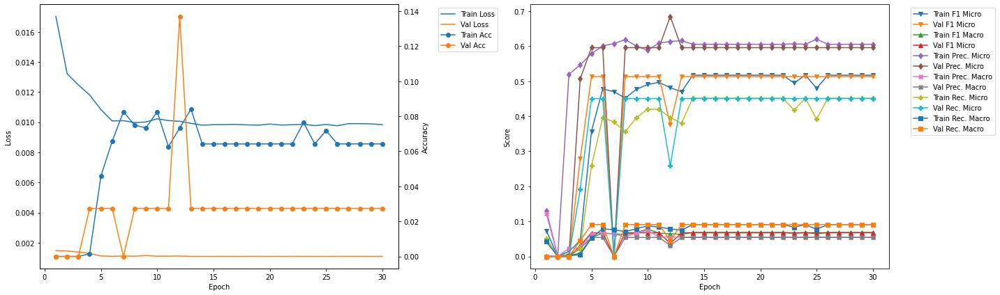

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 3.96
Train Loss: 0.0135 	Validation Loss: 0.0015
Train Accuracy: 0.0076 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0799 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0293 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.2924 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1076 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0463 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0195 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.09
Train Loss: 0.0126 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0

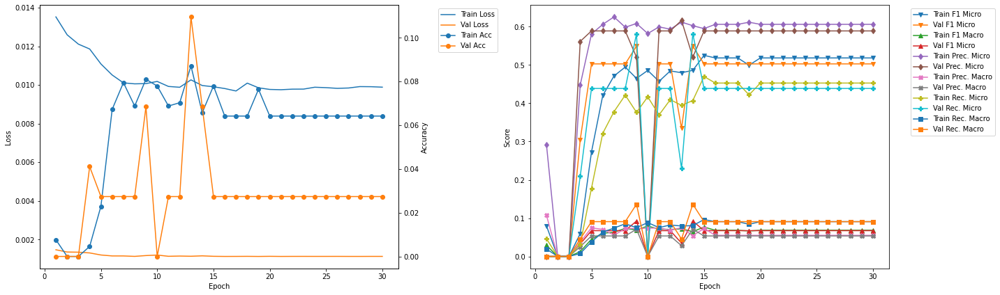

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 7.74
Train Loss: 0.0107 	Validation Loss: 0.0012
Train Accuracy: 0.0581 	Validation Accuracy: 0.0
Train F1 Mirco: 0.4484 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0751 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5624 	Validation Precision Micro: 0.0
Train Precision Marco: 0.075 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.3728 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0796 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 7.87
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.0
Train F1 Mirco: 0.4544 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0623 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.6025 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.3647 	Validation Recall Micro: 0.0
Train R

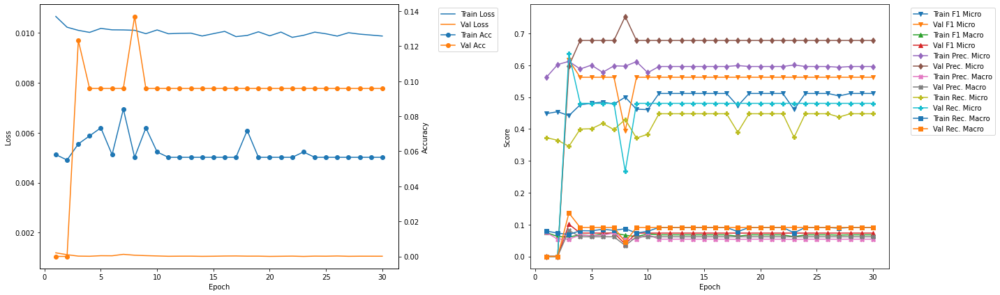

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.53
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4683 	Validation F1 Micro: 0.5496
Train F1 Marco: 0.063 	Validation F1 Macro: 0.0723
Train Precision Mirco: 0.6103 	Validation Precision Micro: 0.6644
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0604
Train Recall Mirco: 0.3799 	Validation Recall Micro: 0.4686
Train Recall Marco: 0.0753 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.65
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4769 	Validation F1 Micro: 0.3929
Train F1 Marco: 0.0715 	Validation F1 Macro: 0.0391
Train Precision Mirco: 0.5831 	Validation Precision Micro: 0.7534
Train Precision Marco: 0.0722 	Validation Precision Macro: 0.0342
Train Recall Mirco: 0.403

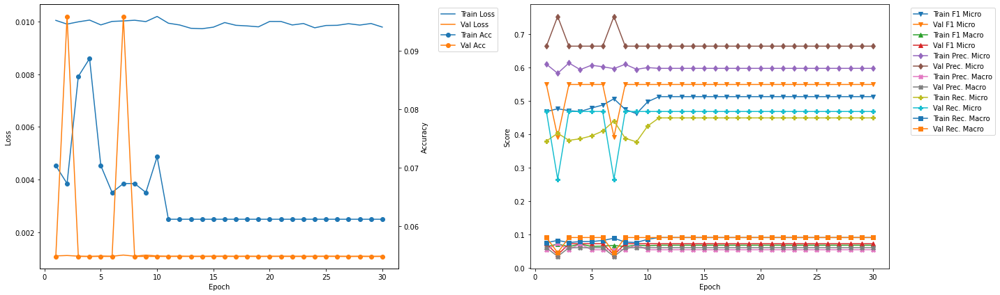

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 15.31
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4959 	Validation F1 Micro: 0.4838
Train F1 Marco: 0.0663 	Validation F1 Macro: 0.0654
Train Precision Mirco: 0.6235 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.056 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4116 	Validation Recall Micro: 0.4249
Train Recall Marco: 0.0813 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.44
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0826 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4982 	Validation F1 Micro: 0.4838
Train F1 Marco: 0.0746 	Validation F1 Macro: 0.0654
Train Precision Mirco: 0.6023 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.075 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4247 	

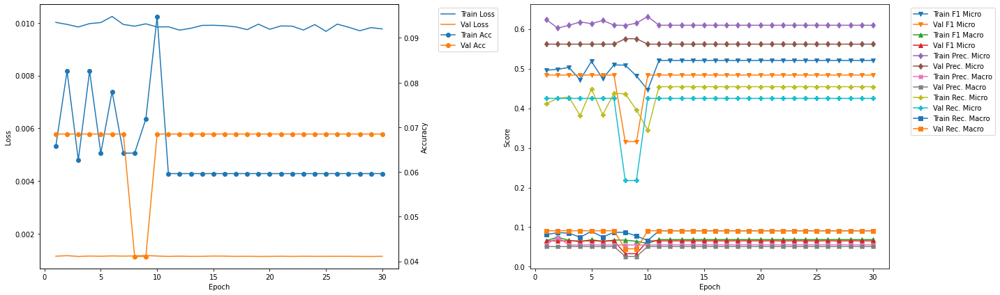

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.1
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0719 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4886 	Validation F1 Micro: 0.5046
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0652
Train Precision Mirco: 0.6095 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0698 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4078 	Validation Recall Micro: 0.4581
Train Recall Marco: 0.0817 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.23
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.078 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4958 	Validation F1 Micro: 0.5046
Train F1 Marco: 0.0724 	Validation F1 Macro: 0.0652
Train Precision Mirco: 0.6034 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0757 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4208 	V

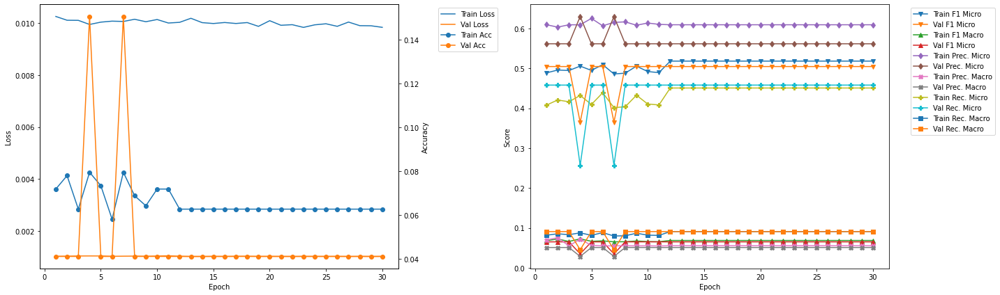

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.89
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0642 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5163 	Validation F1 Micro: 0.4661
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0636
Train Precision Mirco: 0.6122 	Validation Precision Micro: 0.5411
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.4464 	Validation Recall Micro: 0.4093
Train Recall Marco: 0.0888 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.01
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0749 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5215 	Validation F1 Micro: 0.4661
Train F1 Marco: 0.0797 	Validation F1 Macro: 0.0636
Train Precision Mirco: 0.5915 	Validation Precision Micro: 0.5411
Train Precision Marco: 0.0737 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.4664

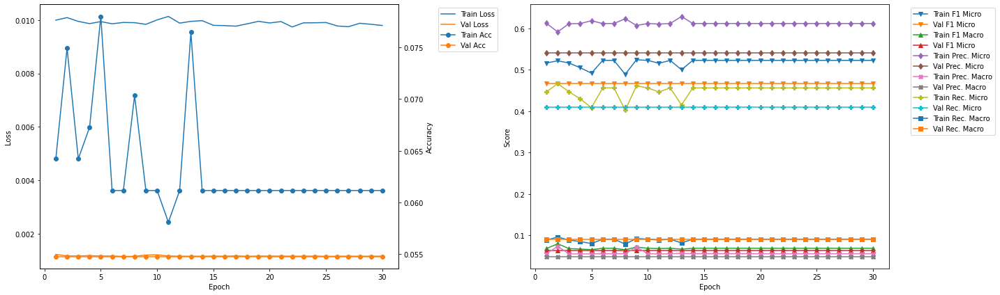

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.68
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0779 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4856 	Validation F1 Micro: 0.5313
Train F1 Marco: 0.0727 	Validation F1 Macro: 0.0691
Train Precision Mirco: 0.5967 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0732 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.4095 	Validation Recall Micro: 0.466
Train Recall Marco: 0.0835 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.8
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0641 	Validation Accuracy: 0.1528
Train F1 Mirco: 0.5023 	Validation F1 Micro: 0.3878
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0377
Train Precision Mirco: 0.6098 	Validation Precision Micro: 0.7083
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0322
Train Recall Mirco: 0.4271

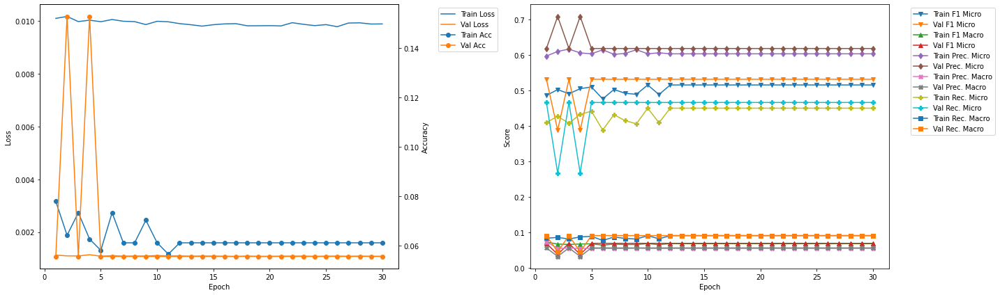

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.48
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0901 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4816 	Validation F1 Micro: 0.506
Train F1 Marco: 0.0726 	Validation F1 Macro: 0.0675
Train Precision Mirco: 0.6052 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0762 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4 	Validation Recall Micro: 0.4427
Train Recall Marco: 0.0808 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.6
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0702 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4985 	Validation F1 Micro: 0.506
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0675
Train Precision Mirco: 0.6107 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4211 	Valid

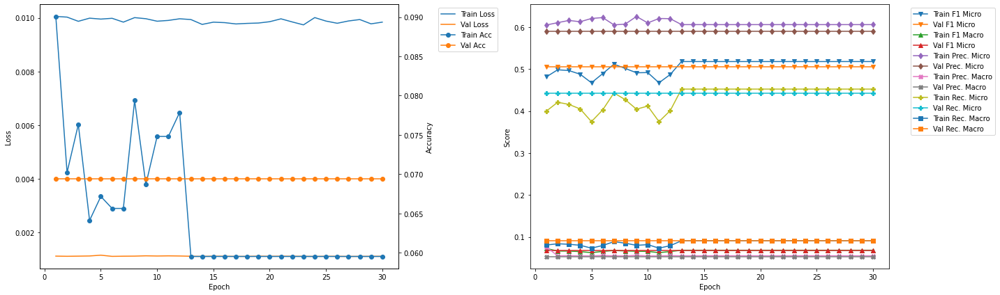

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.27
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4865 	Validation F1 Micro: 0.5455
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0711
Train Precision Mirco: 0.6025 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.408 	Validation Recall Micro: 0.4721
Train Recall Marco: 0.0816 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.4
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4966 	Validation F1 Micro: 0.5455
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0711
Train Precision Mirco: 0.6074 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.42 

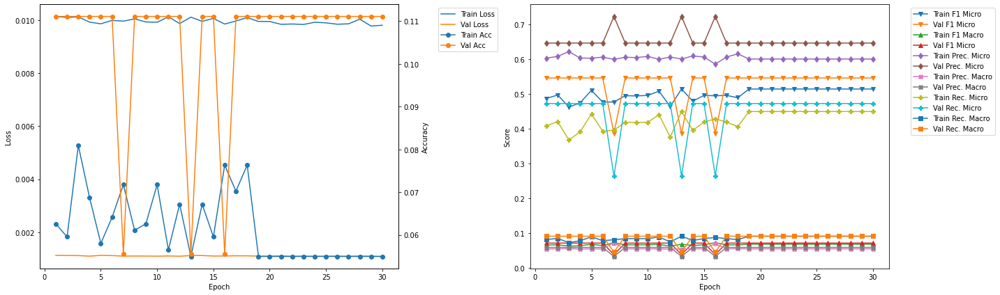

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 3 	Epoch: 3
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.442 	Validation F1 Micro: 0.6165
Train F1 Marco: 0.0608 	Validation F1 Macro: 0.101
Train Precision Mirco: 0.6124 	Validation Precision Micro: 0.5982
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0816
Train Recall Mirco: 0.3458 	Validation Recall Micro: 0.6359
Train Recall Marco: 0.0689 	Validation Recall Macro: 0.1364


In [19]:
resnet18LSTM_700_1_50_best = Kfold_train_CNN_RNN(model = resnet18LSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet18LSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.14
Train Loss: 0.016 	Validation Loss: 0.0014
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0208 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0212 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0595 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0312 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0126 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0248 	Validation Recall Macro: 0.0

Validation F1 Micro Score Increased (0.000000 --> 0.472934).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.29
Train Loss: 0.0119 	Validation Loss: 0.0013
Train Accuracy: 0.026 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.2172 	Validation F1 Micro: 0.4729
Train F1 Marco: 0.0431 	Validation F1 Macro: 0.0657
Train Precision Mirco: 0.5289 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.0614 	Vali

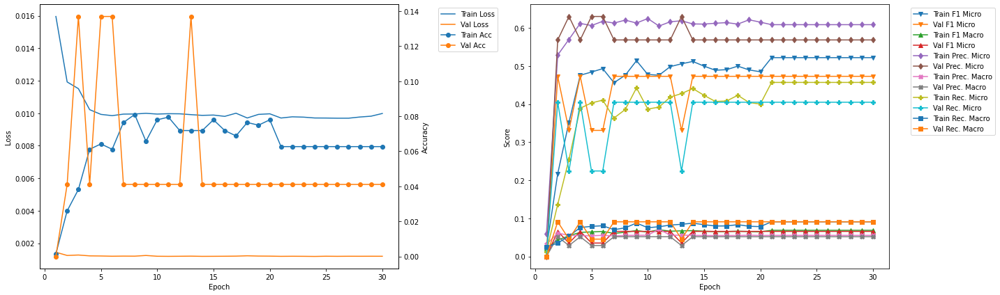

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.472934 --> 0.516667).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 4.4
Train Loss: 0.0117 	Validation Loss: 0.0012
Train Accuracy: 0.026 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.2508 	Validation F1 Micro: 0.5167
Train F1 Marco: 0.0415 	Validation F1 Macro: 0.0707
Train Precision Mirco: 0.5531 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0596 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.1621 	Validation Recall Micro: 0.4346
Train Recall Marco: 0.0347 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.54
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0703 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.491 	Validation F1 Micro: 0.3275
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.5988 	Validation Precision Micro: 0.6438
Train Precision 

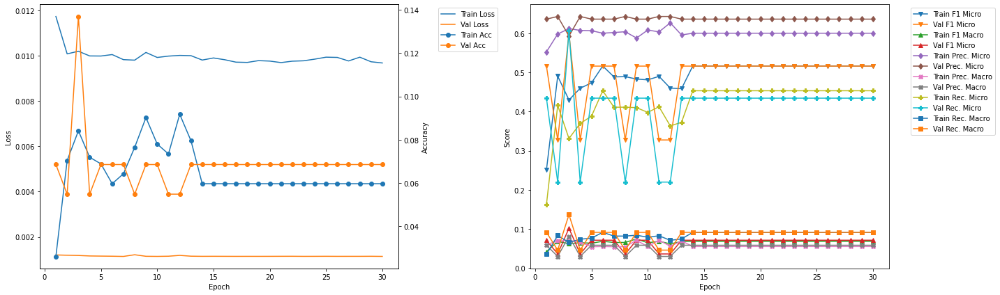

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.65
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0734 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4854 	Validation F1 Micro: 0.5808
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0725
Train Precision Mirco: 0.6036 	Validation Precision Micro: 0.6644
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0604
Train Recall Mirco: 0.4059 	Validation Recall Micro: 0.516
Train Recall Marco: 0.0825 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.79
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4758 	Validation F1 Micro: 0.5808
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.0725
Train Precision Mirco: 0.6072 	Validation Precision Micro: 0.6644
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0604
Train Recall Mirco: 0.3911 	

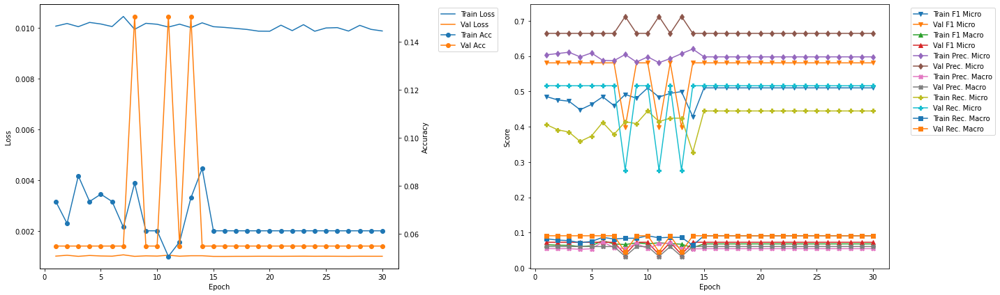

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.9
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5207 	Validation F1 Micro: 0.4821
Train F1 Marco: 0.0688 	Validation F1 Macro: 0.0642
Train Precision Mirco: 0.6101 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.4542 	Validation Recall Micro: 0.4263
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.04
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5207 	Validation F1 Micro: 0.4821
Train F1 Marco: 0.0688 	Validation F1 Macro: 0.0642
Train Precision Mirco: 0.6101 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.4542 	V

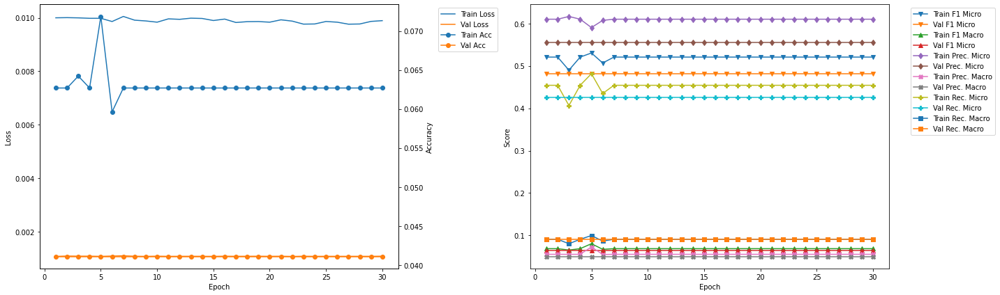

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.16
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.078 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4832 	Validation F1 Micro: 0.4986
Train F1 Marco: 0.0646 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.6143 	Validation Precision Micro: 0.589
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.3982 	Validation Recall Micro: 0.4322
Train Recall Marco: 0.0785 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.3
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.081 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4865 	Validation F1 Micro: 0.4986
Train F1 Marco: 0.0754 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.5952 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0734 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4113 	Va

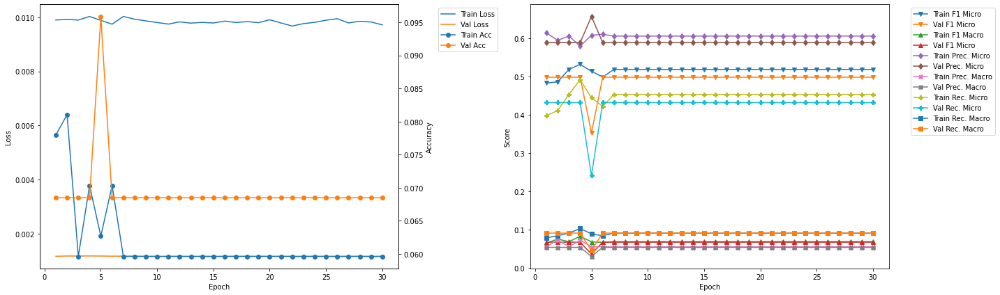

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.41
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5128 	Validation F1 Micro: 0.5089
Train F1 Marco: 0.068 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6072 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4439 	Validation Recall Micro: 0.4479
Train Recall Marco: 0.0891 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.55
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4848 	Validation F1 Micro: 0.5089
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6178 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.3989 	Val

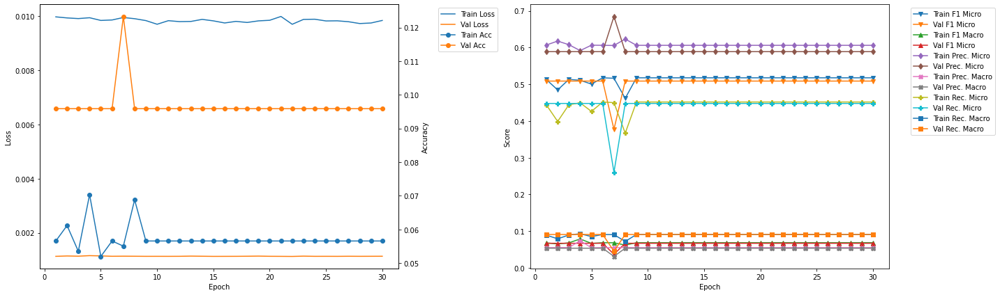

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.66
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5154 	Validation F1 Micro: 0.5303
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0703
Train Precision Mirco: 0.6017 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.4507 	Validation Recall Micro: 0.4577
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.8
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4995 	Validation F1 Micro: 0.5303
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0703
Train Precision Mirco: 0.6034 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.4261 

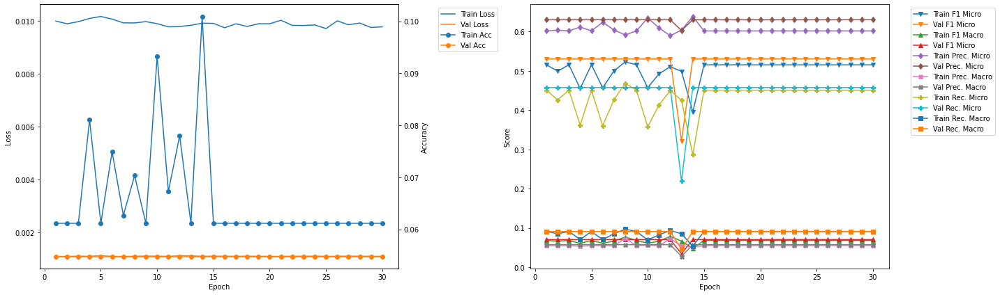

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.92
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5142 	Validation F1 Micro: 0.5407
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.6 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.4499 	Validation Recall Micro: 0.465
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.06
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5142 	Validation F1 Micro: 0.5407
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.6 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.4499 	Valid

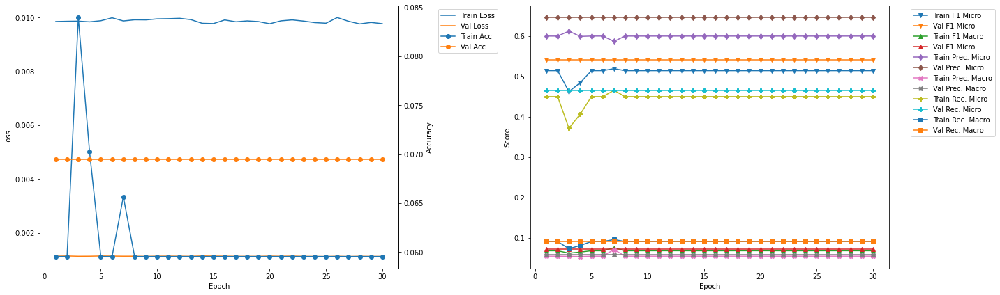

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.17
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4898 	Validation F1 Micro: 0.5316
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.0661
Train Precision Mirco: 0.6041 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.4118 	Validation Recall Micro: 0.4884
Train Recall Marco: 0.0829 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.32
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5154 	Validation F1 Micro: 0.5316
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0661
Train Precision Mirco: 0.6069 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.4479 	Vali

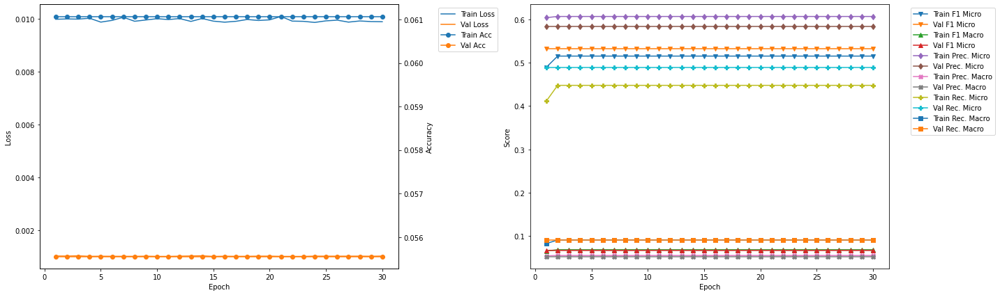

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.43
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5177 	Validation F1 Micro: 0.5091
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0667
Train Precision Mirco: 0.6069 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.4514 	Validation Recall Micro: 0.4516
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.57
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5192 	Validation F1 Micro: 0.5091
Train F1 Marco: 0.0718 	Validation F1 Macro: 0.0667
Train Precision Mirco: 0.6007 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0703 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.4571 

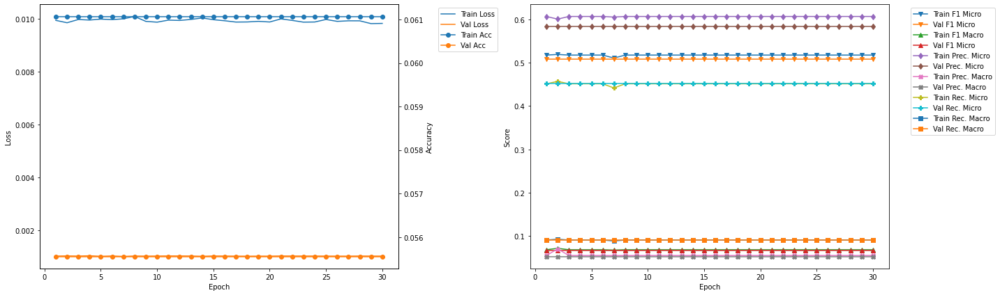

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 2 	Epoch: 3
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0841 	Validation Accuracy: 0.137
Train F1 Mirco: 0.43 	Validation F1 Micro: 0.6005
Train F1 Marco: 0.0616 	Validation F1 Macro: 0.1013
Train Precision Mirco: 0.6126 	Validation Precision Micro: 0.5936
Train Precision Marco: 0.0703 	Validation Precision Macro: 0.0809
Train Recall Mirco: 0.3312 	Validation Recall Micro: 0.6075
Train Recall Marco: 0.0651 	Validation Recall Macro: 0.1364


In [20]:
resnet50LSTM_700_1_50_best = Kfold_train_CNN_RNN(model = resnet50LSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet50LSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.0177 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0631 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0456 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1366 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1311 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.041 	Validation Recall Micro: 0.0
Train Recall Marco: 0.037 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.32
Train Loss: 0.0126 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

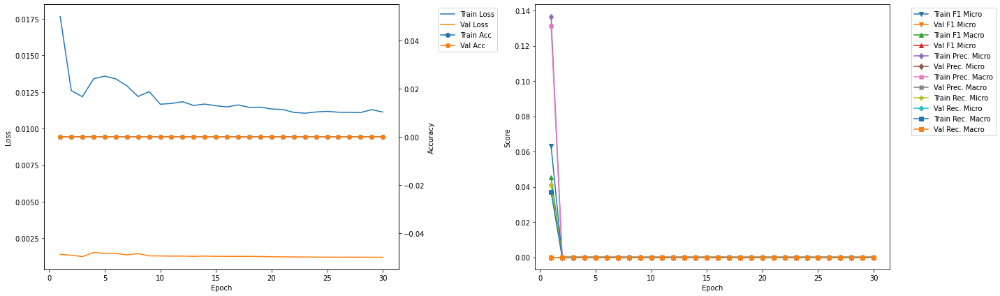

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.98
Train Loss: 0.0136 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.14
Train Loss: 0.0125 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

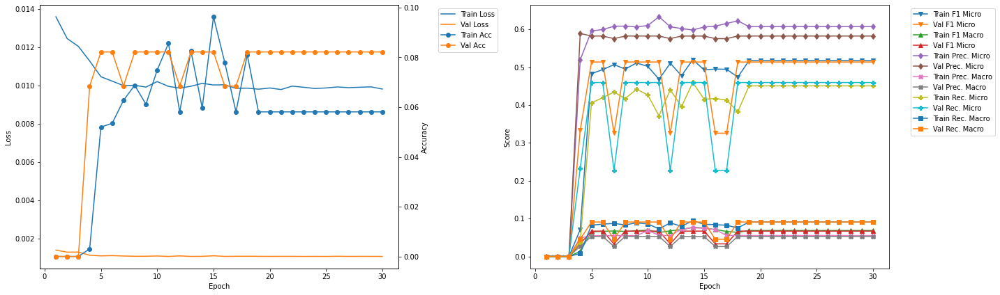

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.513595 --> 0.532934).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 9.82
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.473 	Validation F1 Micro: 0.5329
Train F1 Marco: 0.064 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6119 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.3854 	Validation Recall Micro: 0.4734
Train Recall Marco: 0.0769 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.98
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0642 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4959 	Validation F1 Micro: 0.5329
Train F1 Marco: 0.0713 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.5946 	Validation Precision Micro: 0.6096
Train Precision M

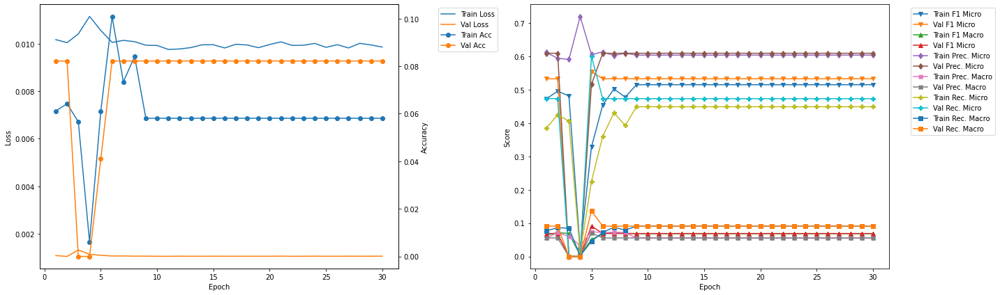

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.65
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0719 	Validation Accuracy: 0.1644
Train F1 Mirco: 0.5145 	Validation F1 Micro: 0.4275
Train F1 Marco: 0.0793 	Validation F1 Macro: 0.0395
Train Precision Mirco: 0.5852 	Validation Precision Micro: 0.7671
Train Precision Marco: 0.0728 	Validation Precision Macro: 0.0349
Train Recall Mirco: 0.459 	Validation Recall Micro: 0.2963
Train Recall Marco: 0.0961 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.81
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.052 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4895 	Validation F1 Micro: 0.5433
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0689
Train Precision Mirco: 0.601 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.413 	Va

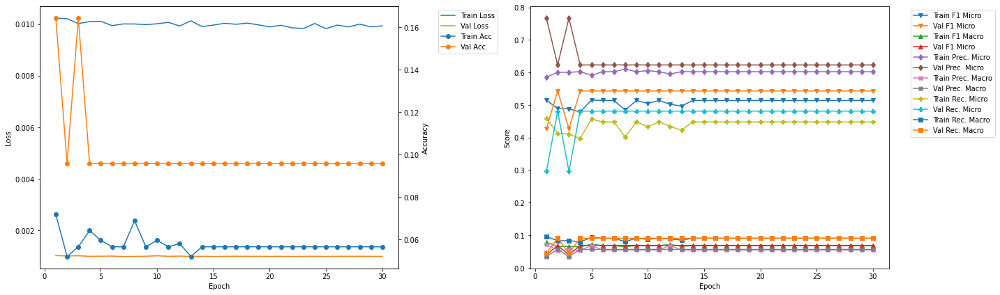

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.47
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0749 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4873 	Validation F1 Micro: 0.3594
Train F1 Marco: 0.0654 	Validation F1 Macro: 0.0351
Train Precision Mirco: 0.6149 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0286
Train Recall Mirco: 0.4036 	Validation Recall Micro: 0.2514
Train Recall Marco: 0.0804 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.63
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0642 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.498 	Validation F1 Micro: 0.5167
Train F1 Marco: 0.0666 	Validation F1 Macro: 0.0668
Train Precision Mirco: 0.6126 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4195 	V

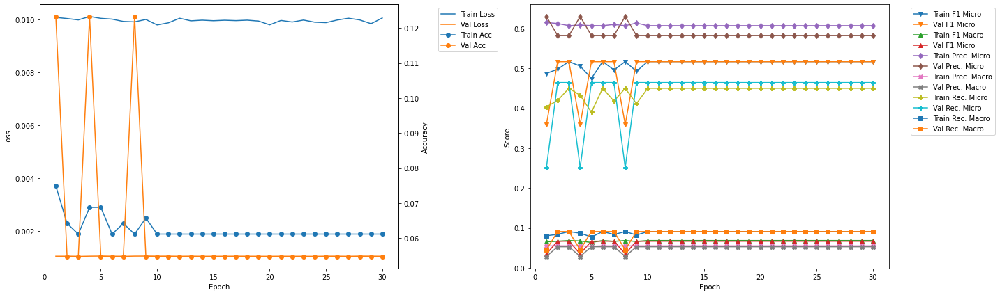

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.28
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4838 	Validation F1 Micro: 0.5042
Train F1 Marco: 0.0676 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6054 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0713 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4029 	Validation Recall Micro: 0.43
Train Recall Marco: 0.0804 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.45
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4939 	Validation F1 Micro: 0.5042
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6026 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4184

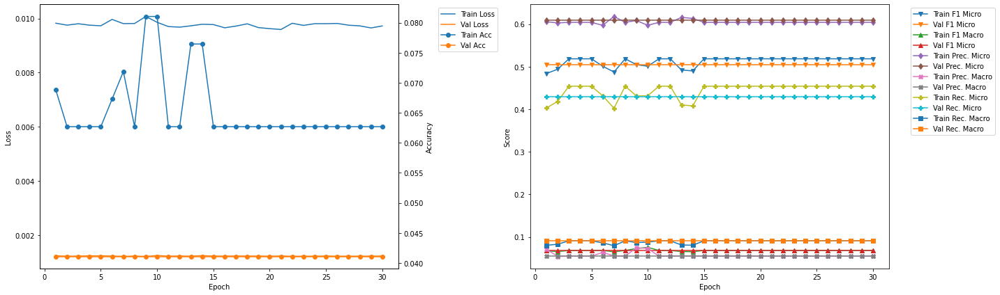

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.1
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0887 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4775 	Validation F1 Micro: 0.5263
Train F1 Marco: 0.0663 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.6037 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.069 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.3949 	Validation Recall Micro: 0.4419
Train Recall Marco: 0.0784 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.26
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5158 	Validation F1 Micro: 0.5263
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.5994 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.4527 	Val

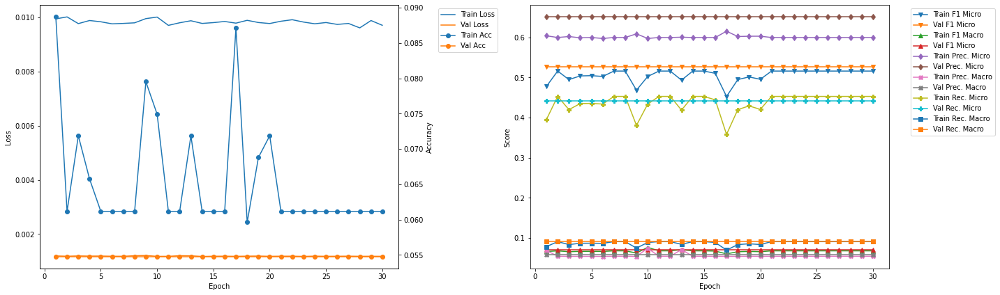

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.92
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0794 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4961 	Validation F1 Micro: 0.5543
Train F1 Marco: 0.0663 	Validation F1 Macro: 0.0729
Train Precision Mirco: 0.605 	Validation Precision Micro: 0.6736
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0612
Train Recall Mirco: 0.4204 	Validation Recall Micro: 0.4709
Train Recall Marco: 0.0845 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.08
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5056 	Validation F1 Micro: 0.5543
Train F1 Marco: 0.067 	Validation F1 Macro: 0.0729
Train Precision Mirco: 0.5953 	Validation Precision Micro: 0.6736
Train Precision Marco: 0.054 	Validation Precision Macro: 0.0612
Train Recall Mirco: 0.4394 

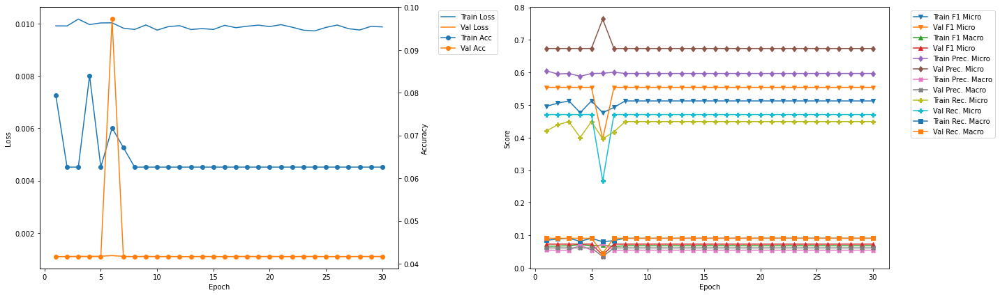

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.74
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0534 	Validation Accuracy: 0.125
Train F1 Mirco: 0.515 	Validation F1 Micro: 0.5341
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.6023 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.4498 	Validation Recall Micro: 0.4663
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.9
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0534 	Validation Accuracy: 0.125
Train F1 Mirco: 0.515 	Validation F1 Micro: 0.5341
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.6023 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.4498 	Valid

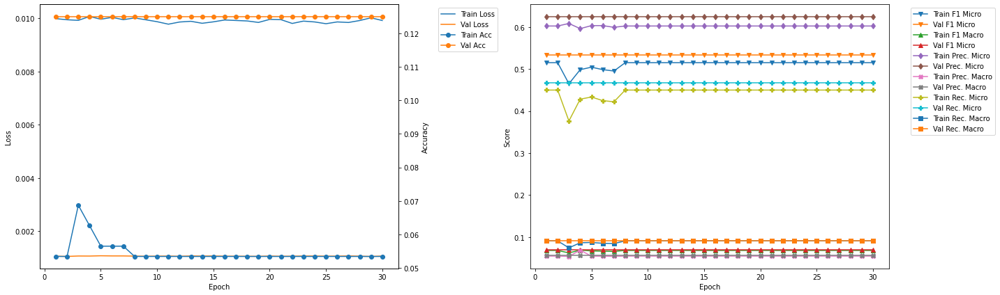

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 43.57
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0748 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4944 	Validation F1 Micro: 0.4398
Train F1 Marco: 0.0721 	Validation F1 Macro: 0.0611
Train Precision Mirco: 0.6066 	Validation Precision Micro: 0.5069
Train Precision Marco: 0.071 	Validation Precision Macro: 0.0461
Train Recall Mirco: 0.4173 	Validation Recall Micro: 0.3883
Train Recall Marco: 0.0831 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 43.73
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0641 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.5253 	Validation F1 Micro: 0.4398
Train F1 Marco: 0.0691 	Validation F1 Macro: 0.0611
Train Precision Mirco: 0.6153 	Validation Precision Micro: 0.5069
Train Precision Marco: 0.0559 	Validation Precision Macro: 0.0461
Train Recall Mirco: 0.45

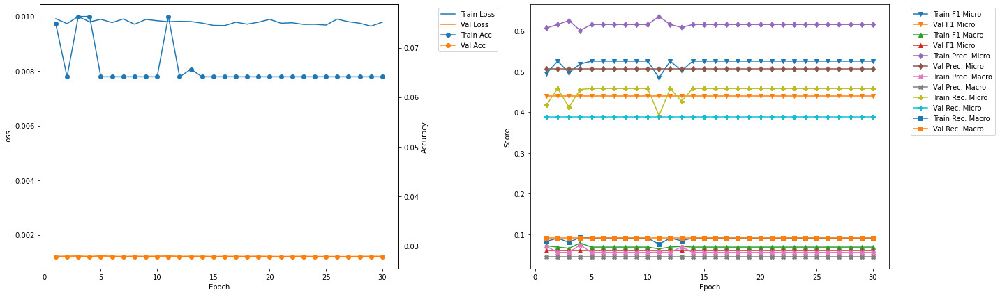

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 3 	Epoch: 5
Train Loss: 0.0106 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.3282 	Validation F1 Micro: 0.5553
Train F1 Marco: 0.0506 	Validation F1 Macro: 0.0913
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.516
Train Precision Marco: 0.0742 	Validation Precision Macro: 0.0704
Train Recall Mirco: 0.2251 	Validation Recall Micro: 0.6011
Train Recall Marco: 0.0453 	Validation Recall Macro: 0.1364


In [21]:
resnet101LSTM_700_1_50_best = Kfold_train_CNN_RNN(model = resnet101LSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet101LSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.0175 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1061 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0723 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1451 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1372 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0837 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0931 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.31
Train Loss: 0.0126 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

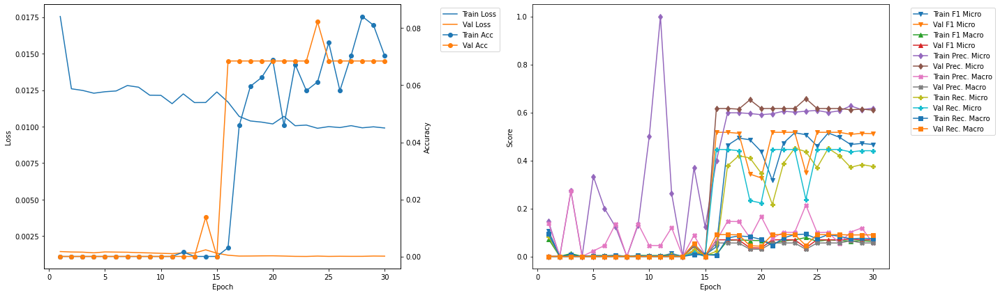

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.82
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.0933 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.433 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0611 	Validation F1 Macro: 0.0663
Train Precision Mirco: 0.6204 	Validation Precision Micro: 0.5714
Train Precision Marco: 0.1217 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.3326 	Validation Recall Micro: 0.4468
Train Recall Marco: 0.0652 	Validation Recall Macro: 0.0838

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.98
Train Loss: 0.0103 	Validation Loss: 0.0012
Train Accuracy: 0.0566 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5013 	Validation F1 Micro: 0.4819
Train F1 Marco: 0.0719 	Validation F1 Macro: 0.0863
Train Precision Mirco: 0.5906 	Validation Precision Micro: 0.5556
Train Precision Marco: 0.1051 	Validation Precision Macro: 0.0689
Train Recall Mirco: 0.4355 

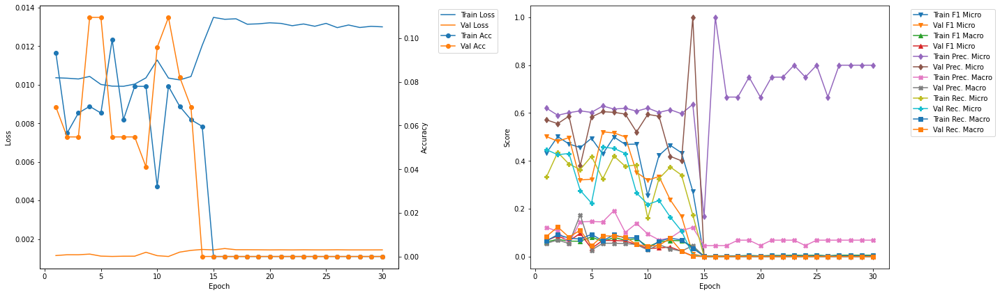

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.49
Train Loss: 0.0137 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0056 	Validation F1 Micro: 0.0
Train F1 Marco: 0.006 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.3125 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0909 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0028 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0031 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.64
Train Loss: 0.0134 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0045 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0049 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0485 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0023 	Validation Recall Micro: 0.0
Train Recall Ma

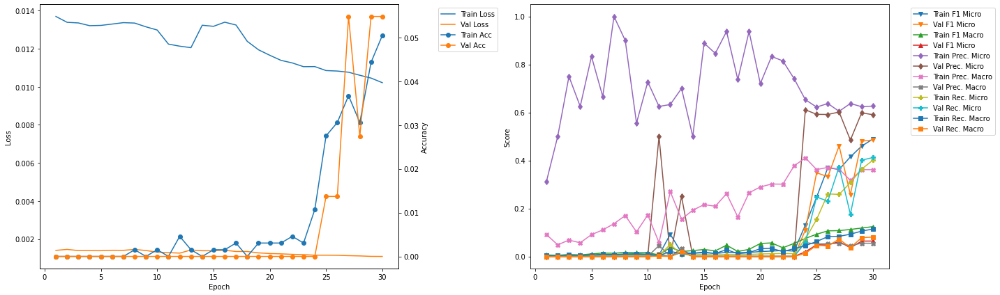

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.14
Train Loss: 0.0114 	Validation Loss: 0.0012
Train Accuracy: 0.026 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.3444 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0774 	Validation F1 Macro: 0.0774
Train Precision Mirco: 0.5884 	Validation Precision Micro: 0.5986
Train Precision Marco: 0.2651 	Validation Precision Macro: 0.1008
Train Recall Mirco: 0.2434 	Validation Recall Micro: 0.4315
Train Recall Marco: 0.0626 	Validation Recall Macro: 0.093

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.29
Train Loss: 0.0105 	Validation Loss: 0.0013
Train Accuracy: 0.0398 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4413 	Validation F1 Micro: 0.2794
Train F1 Marco: 0.0893 	Validation F1 Macro: 0.0419
Train Precision Mirco: 0.6099 	Validation Precision Micro: 0.5067
Train Precision Marco: 0.2635 	Validation Precision Macro: 0.1136
Train Recall Mirco: 0.3457

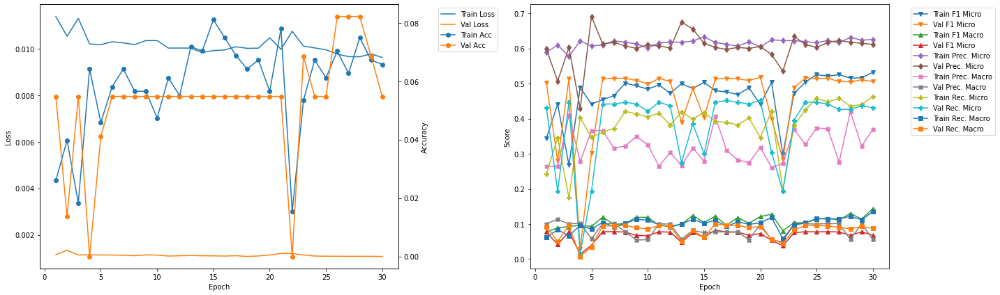

-------------------------------------------
FOLD 5
-------------------------------------------
Validation F1 Micro Score Increased (0.521212 --> 0.523364).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 18.79
Train Loss: 0.0106 	Validation Loss: 0.001
Train Accuracy: 0.0505 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4271 	Validation F1 Micro: 0.5234
Train F1 Marco: 0.1045 	Validation F1 Macro: 0.1293
Train Precision Mirco: 0.6166 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.2658 	Validation Precision Macro: 0.233
Train Recall Mirco: 0.3267 	Validation Recall Micro: 0.48
Train Recall Marco: 0.0901 	Validation Recall Macro: 0.1329

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.95
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0474 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4936 	Validation F1 Micro: 0.4952
Train F1 Marco: 0.1199 	Validation F1 Macro: 0.1383
Train Precision Mirco: 0.6193 	Validation Precision Micro: 0.5662
Train Precision

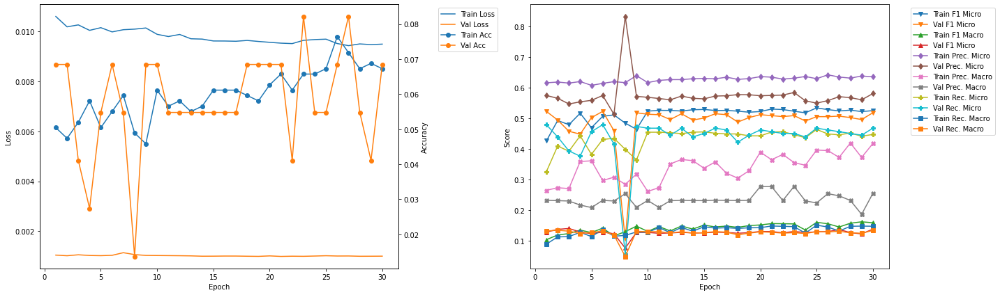

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.45
Train Loss: 0.0105 	Validation Loss: 0.0011
Train Accuracy: 0.0443 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.44 	Validation F1 Micro: 0.5044
Train F1 Marco: 0.1225 	Validation F1 Macro: 0.0956
Train Precision Mirco: 0.5713 	Validation Precision Micro: 0.6099
Train Precision Marco: 0.3478 	Validation Precision Macro: 0.1232
Train Recall Mirco: 0.3578 	Validation Recall Micro: 0.43
Train Recall Marco: 0.1035 	Validation Recall Macro: 0.1025

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.61
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0566 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.498 	Validation F1 Micro: 0.4897
Train F1 Marco: 0.1454 	Validation F1 Macro: 0.1
Train Precision Mirco: 0.6148 	Validation Precision Micro: 0.5971
Train Precision Marco: 0.4189 	Validation Precision Macro: 0.1238
Train Recall Mirco: 0.4184 	Vali

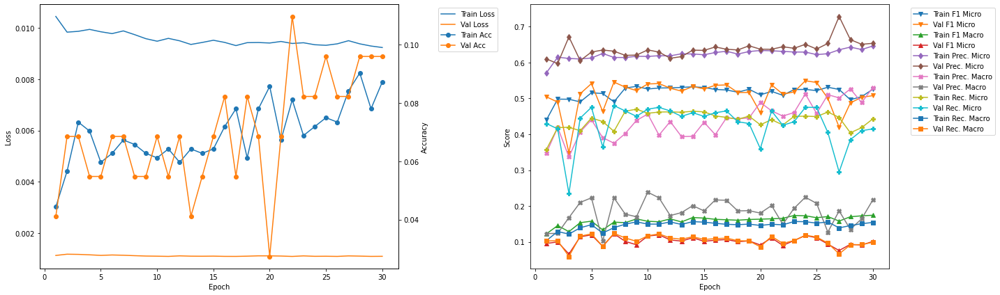

-------------------------------------------
FOLD 7
-------------------------------------------
Validation F1 Micro Score Increased (0.549133 --> 0.556757).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 28.14
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4796 	Validation F1 Micro: 0.5568
Train F1 Marco: 0.1423 	Validation F1 Macro: 0.18
Train Precision Mirco: 0.5937 	Validation Precision Micro: 0.6959
Train Precision Marco: 0.3728 	Validation Precision Macro: 0.2452
Train Recall Mirco: 0.4023 	Validation Recall Micro: 0.464
Train Recall Marco: 0.1264 	Validation Recall Macro: 0.1794

Validation F1 Micro Score Increased (0.556757 --> 0.566929).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.3
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4445 	Validation F1 Micro: 0.5669
Train F1 Marco: 0.1354 	Validation F1 Macro: 0.1858


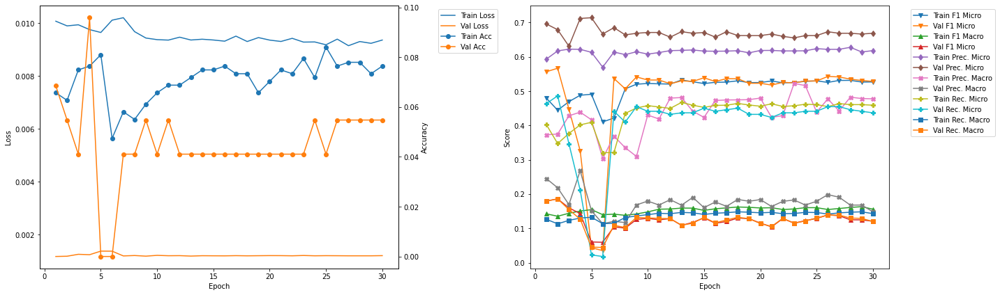

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 32.81
Train Loss: 0.0107 	Validation Loss: 0.0011
Train Accuracy: 0.0412 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4119 	Validation F1 Micro: 0.4906
Train F1 Marco: 0.1147 	Validation F1 Macro: 0.1048
Train Precision Mirco: 0.5662 	Validation Precision Micro: 0.6047
Train Precision Marco: 0.2661 	Validation Precision Macro: 0.1467
Train Recall Mirco: 0.3237 	Validation Recall Micro: 0.4127
Train Recall Marco: 0.0957 	Validation Recall Macro: 0.1065

Epoch 2 	Learning Rate: 0.01 	Time (min): 32.96
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0473 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4868 	Validation F1 Micro: 0.4606
Train F1 Marco: 0.1446 	Validation F1 Macro: 0.094
Train Precision Mirco: 0.6139 	Validation Precision Micro: 0.5703
Train Precision Marco: 0.3483 	Validation Precision Macro: 0.1034
Train Recall Mirco: 0.403

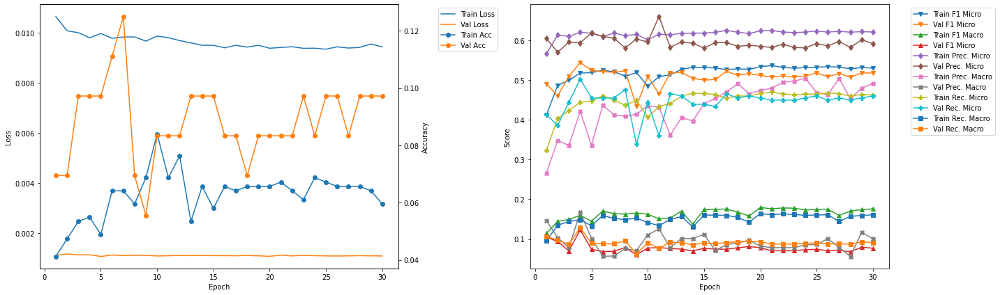

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.46
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.087 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4941 	Validation F1 Micro: 0.5
Train F1 Marco: 0.151 	Validation F1 Macro: 0.1993
Train Precision Mirco: 0.6211 	Validation Precision Micro: 0.6054
Train Precision Marco: 0.3819 	Validation Precision Macro: 0.2692
Train Recall Mirco: 0.4102 	Validation Recall Micro: 0.4258
Train Recall Marco: 0.1317 	Validation Recall Macro: 0.1878

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.62
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0824 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.494 	Validation F1 Micro: 0.4926
Train F1 Marco: 0.1553 	Validation F1 Macro: 0.169
Train Precision Mirco: 0.618 	Validation Precision Micro: 0.6484
Train Precision Marco: 0.3491 	Validation Precision Macro: 0.2185
Train Recall Mirco: 0.4114 	Vali

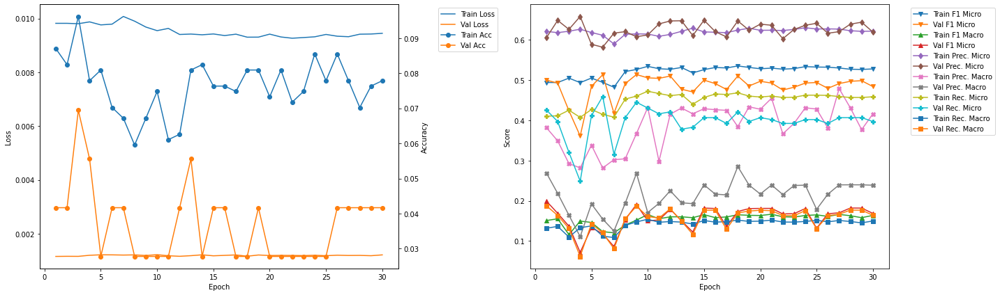

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.12
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4604 	Validation F1 Micro: 0.3656
Train F1 Marco: 0.1218 	Validation F1 Macro: 0.0775
Train Precision Mirco: 0.579 	Validation Precision Micro: 0.5312
Train Precision Marco: 0.3098 	Validation Precision Macro: 0.1131
Train Recall Mirco: 0.3821 	Validation Recall Micro: 0.2787
Train Recall Marco: 0.105 	Validation Recall Macro: 0.0768

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.28
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0656 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4971 	Validation F1 Micro: 0.3973
Train F1 Marco: 0.1767 	Validation F1 Macro: 0.0815
Train Precision Mirco: 0.6211 	Validation Precision Micro: 0.5175
Train Precision Marco: 0.3653 	Validation Precision Macro: 0.1341
Train Recall Mirco: 0.414

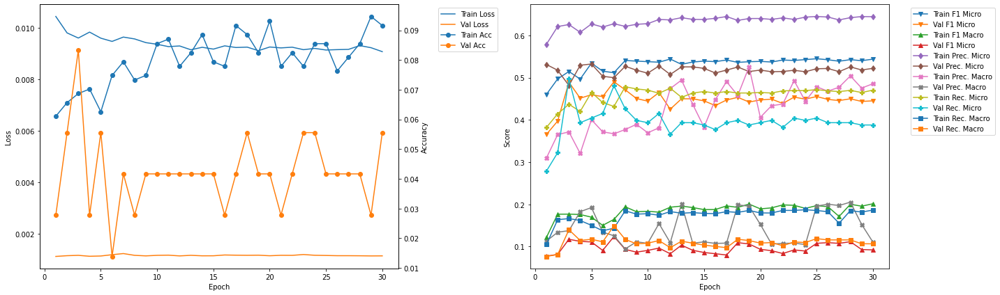

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 7 	Epoch: 2
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4445 	Validation F1 Micro: 0.5669
Train F1 Marco: 0.1354 	Validation F1 Macro: 0.1858
Train Precision Mirco: 0.6175 	Validation Precision Micro: 0.6792
Train Precision Marco: 0.3751 	Validation Precision Macro: 0.2183
Train Recall Mirco: 0.3472 	Validation Recall Micro: 0.4865
Train Recall Marco: 0.1132 	Validation Recall Macro: 0.186


In [22]:
densenet121LSTM_700_1_50_best = Kfold_train_CNN_RNN(model = densenet121LSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet121LSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.18
Train Loss: 0.0176 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0623 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0371 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1059 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0977 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0441 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0425 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.35
Train Loss: 0.0123 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0023 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0026 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0909 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0
Train Recall M

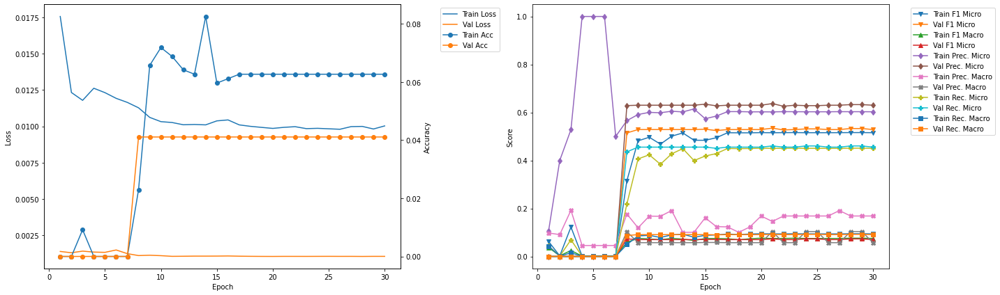

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.5
Train Loss: 0.0107 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4744 	Validation F1 Micro: 0.5245
Train F1 Marco: 0.0727 	Validation F1 Macro: 0.0691
Train Precision Mirco: 0.5761 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0992 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.4032 	Validation Recall Micro: 0.4527
Train Recall Marco: 0.084 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.68
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5141 	Validation F1 Micro: 0.5245
Train F1 Marco: 0.0731 	Validation F1 Macro: 0.0691
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.123 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.4496 	V

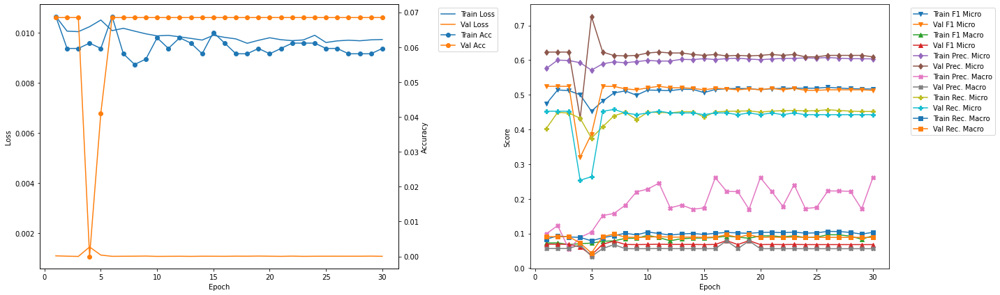

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 10.78
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4668 	Validation F1 Micro: 0.4871
Train F1 Marco: 0.0912 	Validation F1 Macro: 0.0844
Train Precision Mirco: 0.598 	Validation Precision Micro: 0.5782
Train Precision Marco: 0.2444 	Validation Precision Macro: 0.0834
Train Recall Mirco: 0.3828 	Validation Recall Micro: 0.4208
Train Recall Marco: 0.092 	Validation Recall Macro: 0.1007

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.95
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.499 	Validation F1 Micro: 0.4734
Train F1 Marco: 0.0723 	Validation F1 Macro: 0.0756
Train Precision Mirco: 0.6072 	Validation Precision Micro: 0.5882
Train Precision Marco: 0.0832 	Validation Precision Macro: 0.0768
Train Recall Mirco: 0.4235 	V

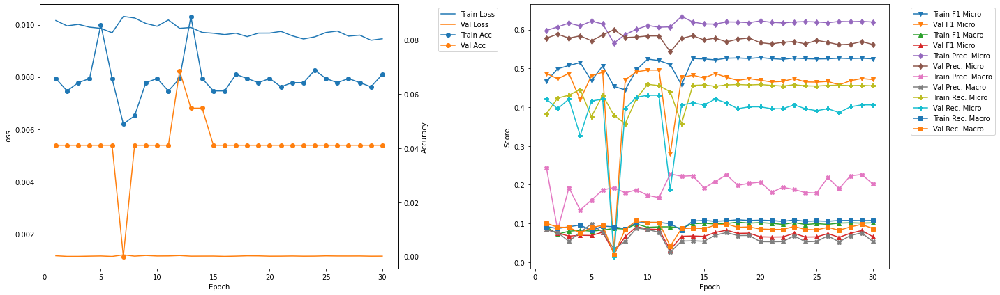

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 16.05
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5054 	Validation F1 Micro: 0.5257
Train F1 Marco: 0.0962 	Validation F1 Macro: 0.0863
Train Precision Mirco: 0.5911 	Validation Precision Micro: 0.6345
Train Precision Marco: 0.1834 	Validation Precision Macro: 0.1038
Train Recall Mirco: 0.4414 	Validation Recall Micro: 0.4488
Train Recall Marco: 0.1018 	Validation Recall Macro: 0.097

Epoch 2 	Learning Rate: 0.01 	Time (min): 16.22
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5002 	Validation F1 Micro: 0.5245
Train F1 Marco: 0.0942 	Validation F1 Macro: 0.092
Train Precision Mirco: 0.6116 	Validation Precision Micro: 0.6408
Train Precision Marco: 0.2064 	Validation Precision Macro: 0.1039
Train Recall Mirco: 0.4231 	

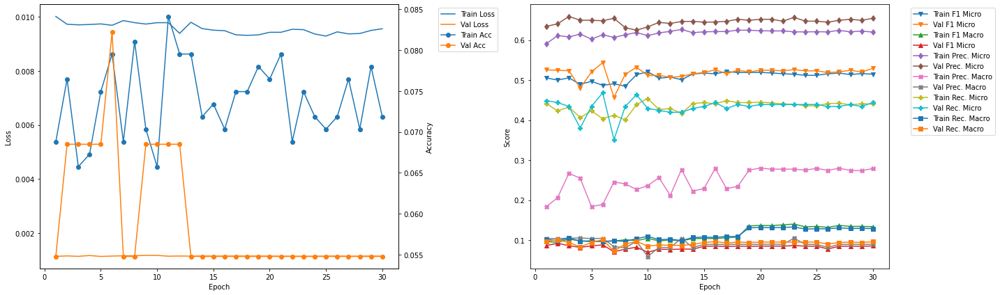

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.34
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0795 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5256 	Validation F1 Micro: 0.4702
Train F1 Marco: 0.1097 	Validation F1 Macro: 0.0859
Train Precision Mirco: 0.6159 	Validation Precision Micro: 0.6172
Train Precision Marco: 0.1925 	Validation Precision Macro: 0.0893
Train Recall Mirco: 0.4583 	Validation Recall Micro: 0.3798
Train Recall Marco: 0.1104 	Validation Recall Macro: 0.0941

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.52
Train Loss: 0.0095 	Validation Loss: 0.0012
Train Accuracy: 0.0856 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4898 	Validation F1 Micro: 0.4957
Train F1 Marco: 0.1249 	Validation F1 Macro: 0.076
Train Precision Mirco: 0.6269 	Validation Precision Micro: 0.6187
Train Precision Marco: 0.2657 	Validation Precision Macro: 0.1015
Train Recall Mirco: 0.402

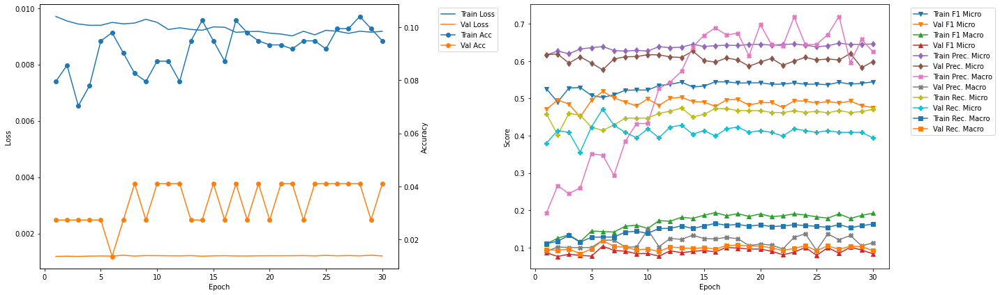

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.61
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0841 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.5153 	Validation F1 Micro: 0.5215
Train F1 Marco: 0.1643 	Validation F1 Macro: 0.1331
Train Precision Mirco: 0.6328 	Validation Precision Micro: 0.6115
Train Precision Marco: 0.4911 	Validation Precision Macro: 0.1311
Train Recall Mirco: 0.4347 	Validation Recall Micro: 0.4545
Train Recall Marco: 0.1378 	Validation Recall Macro: 0.1473

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.79
Train Loss: 0.0094 	Validation Loss: 0.001
Train Accuracy: 0.0765 	Validation Accuracy: 0.1781
Train F1 Mirco: 0.5091 	Validation F1 Micro: 0.4631
Train F1 Marco: 0.1485 	Validation F1 Macro: 0.0831
Train Precision Mirco: 0.6384 	Validation Precision Micro: 0.6216
Train Precision Marco: 0.439 	Validation Precision Macro: 0.09
Train Recall Mirco: 0.4233 	

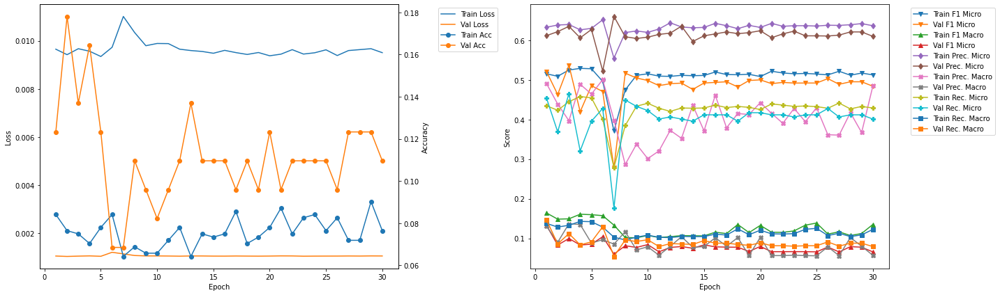

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.89
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0734 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5103 	Validation F1 Micro: 0.5096
Train F1 Marco: 0.128 	Validation F1 Macro: 0.0663
Train Precision Mirco: 0.6338 	Validation Precision Micro: 0.6154
Train Precision Marco: 0.3747 	Validation Precision Macro: 0.0551
Train Recall Mirco: 0.4271 	Validation Recall Micro: 0.4348
Train Recall Marco: 0.1191 	Validation Recall Macro: 0.0835

Epoch 2 	Learning Rate: 0.01 	Time (min): 32.06
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0917 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5108 	Validation F1 Micro: 0.4675
Train F1 Marco: 0.1243 	Validation F1 Macro: 0.0721
Train Precision Mirco: 0.6456 	Validation Precision Micro: 0.5806
Train Precision Marco: 0.4115 	Validation Precision Macro: 0.0976
Train Recall Mirco: 0.4226 

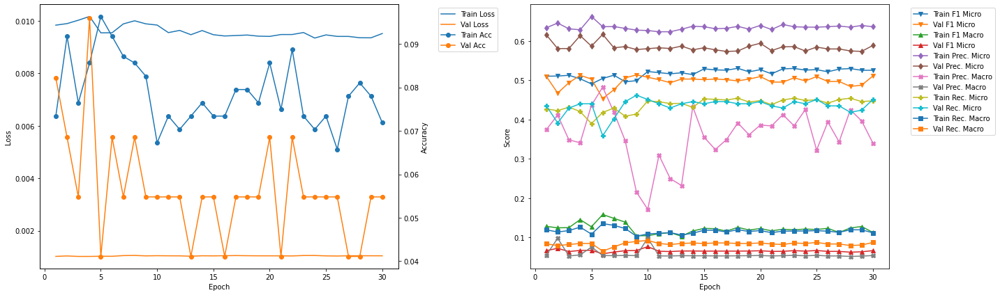

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.16
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4922 	Validation F1 Micro: 0.5409
Train F1 Marco: 0.0999 	Validation F1 Macro: 0.1139
Train Precision Mirco: 0.6138 	Validation Precision Micro: 0.6565
Train Precision Marco: 0.1897 	Validation Precision Macro: 0.1803
Train Recall Mirco: 0.4108 	Validation Recall Micro: 0.4599
Train Recall Marco: 0.0994 	Validation Recall Macro: 0.1107

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.33
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.084 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5159 	Validation F1 Micro: 0.53
Train F1 Marco: 0.1141 	Validation F1 Macro: 0.1193
Train Precision Mirco: 0.6194 	Validation Precision Micro: 0.6462
Train Precision Marco: 0.3381 	Validation Precision Macro: 0.1423
Train Recall Mirco: 0.442 	

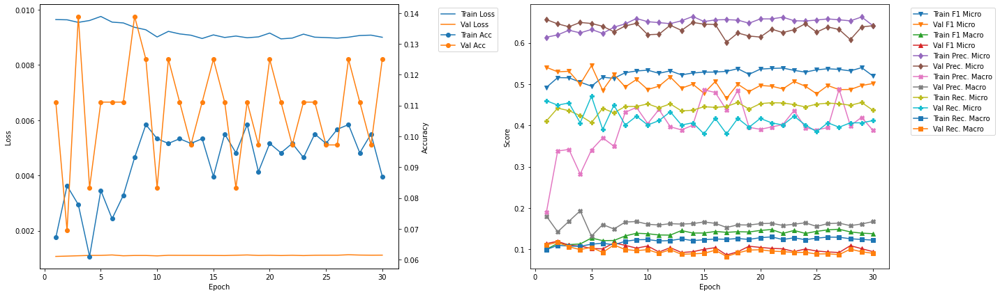

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.45
Train Loss: 0.0096 	Validation Loss: 0.001
Train Accuracy: 0.0809 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4944 	Validation F1 Micro: 0.5427
Train F1 Marco: 0.1167 	Validation F1 Macro: 0.1671
Train Precision Mirco: 0.6408 	Validation Precision Micro: 0.6138
Train Precision Marco: 0.3751 	Validation Precision Macro: 0.2455
Train Recall Mirco: 0.4025 	Validation Recall Micro: 0.4863
Train Recall Marco: 0.1029 	Validation Recall Macro: 0.1587

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.62
Train Loss: 0.0094 	Validation Loss: 0.001
Train Accuracy: 0.0992 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5051 	Validation F1 Micro: 0.5266
Train F1 Marco: 0.122 	Validation F1 Macro: 0.1567
Train Precision Mirco: 0.6564 	Validation Precision Micro: 0.5742
Train Precision Marco: 0.3011 	Validation Precision Macro: 0.2351
Train Recall Mirco: 0.4104 

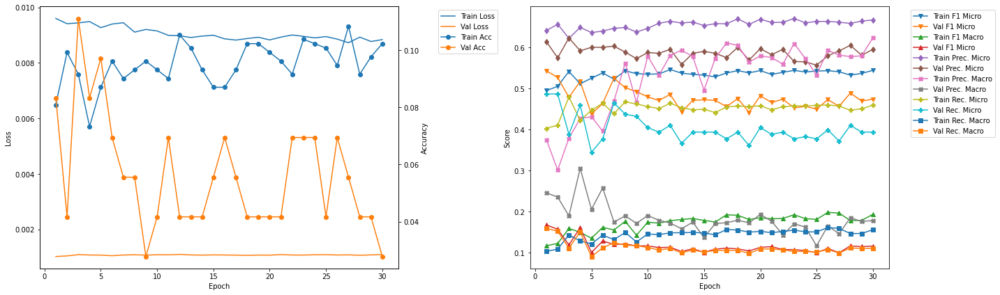

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 47.71
Train Loss: 0.0095 	Validation Loss: 0.001
Train Accuracy: 0.0809 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4995 	Validation F1 Micro: 0.5405
Train F1 Marco: 0.1559 	Validation F1 Macro: 0.1363
Train Precision Mirco: 0.6298 	Validation Precision Micro: 0.6207
Train Precision Marco: 0.4679 	Validation Precision Macro: 0.2306
Train Recall Mirco: 0.4139 	Validation Recall Micro: 0.4787
Train Recall Marco: 0.1296 	Validation Recall Macro: 0.137

Validation F1 Micro Score Increased (0.544892 --> 0.546584).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 47.9
Train Loss: 0.0093 	Validation Loss: 0.001
Train Accuracy: 0.0824 	Validation Accuracy: 0.125
Train F1 Mirco: 0.5328 	Validation F1 Micro: 0.5466
Train F1 Marco: 0.1821 	Validation F1 Macro: 0.1419
Train Precision Mirco: 0.6374 	Validation Precision Micro: 0.6567
Train Precision

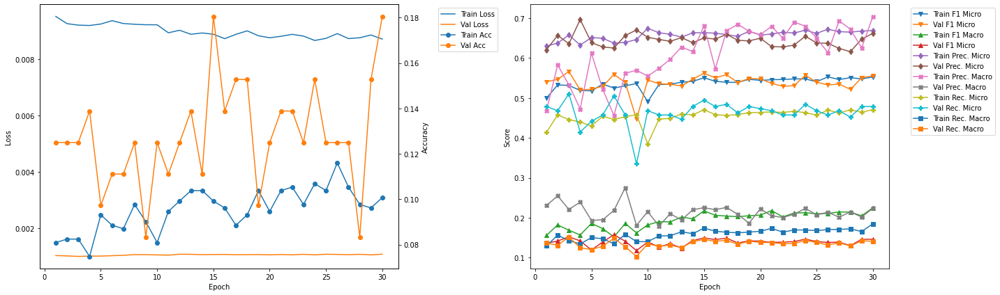

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 10 	Epoch: 3
Train Loss: 0.0092 	Validation Loss: 0.001
Train Accuracy: 0.0824 	Validation Accuracy: 0.125
Train F1 Mirco: 0.5313 	Validation F1 Micro: 0.5664
Train F1 Marco: 0.1689 	Validation F1 Macro: 0.1525
Train Precision Mirco: 0.6577 	Validation Precision Micro: 0.6358
Train Precision Marco: 0.5326 	Validation Precision Macro: 0.2208
Train Recall Mirco: 0.4457 	Validation Recall Micro: 0.5106
Train Recall Marco: 0.1431 	Validation Recall Macro: 0.1521


In [23]:
densenet169LSTM_700_1_50_best = Kfold_train_CNN_RNN(model = densenet169LSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet169LSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.19
Train Loss: 0.017 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0726 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0588 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1749 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1554 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0458 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0465 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.38
Train Loss: 0.0128 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0045 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0031 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1739 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1591 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0023 	Validation Recall Micro: 0.0
Train Recall

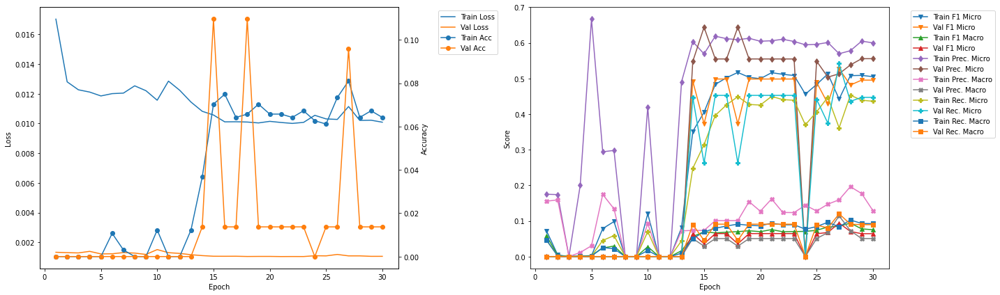

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.93
Train Loss: 0.0103 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.457 	Validation F1 Micro: 0.4643
Train F1 Marco: 0.0826 	Validation F1 Macro: 0.0652
Train Precision Mirco: 0.5804 	Validation Precision Micro: 0.6393
Train Precision Marco: 0.1889 	Validation Precision Macro: 0.0583
Train Recall Mirco: 0.3768 	Validation Recall Micro: 0.3645
Train Recall Marco: 0.083 	Validation Recall Macro: 0.0743

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.12
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0703 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4533 	Validation F1 Micro: 0.5084
Train F1 Marco: 0.0717 	Validation F1 Macro: 0.07
Train Precision Mirco: 0.6036 	Validation Precision Micro: 0.6319
Train Precision Marco: 0.1448 	Validation Precision Macro: 0.0583
Train Recall Mirco: 0.363 	Val

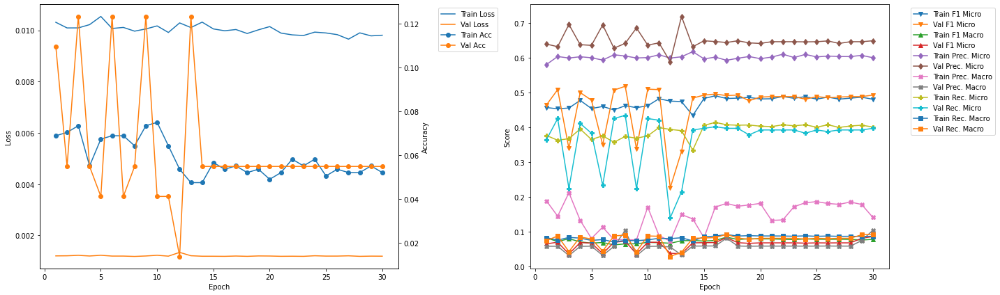

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.62
Train Loss: 0.0103 	Validation Loss: 0.0012
Train Accuracy: 0.0703 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4346 	Validation F1 Micro: 0.4431
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.076
Train Precision Mirco: 0.6057 	Validation Precision Micro: 0.5781
Train Precision Marco: 0.1225 	Validation Precision Macro: 0.0994
Train Recall Mirco: 0.3389 	Validation Recall Micro: 0.3592
Train Recall Marco: 0.0699 	Validation Recall Macro: 0.0853

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.81
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4616 	Validation F1 Micro: 0.4838
Train F1 Marco: 0.0759 	Validation F1 Macro: 0.0954
Train Precision Mirco: 0.5971 	Validation Precision Micro: 0.6165
Train Precision Marco: 0.1534 	Validation Precision Macro: 0.147
Train Recall Mirco: 0.3762

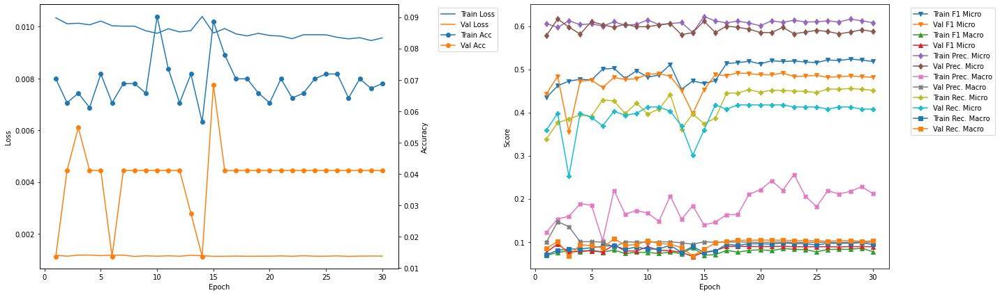

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.31
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0443 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4517 	Validation F1 Micro: 0.3429
Train F1 Marco: 0.0783 	Validation F1 Macro: 0.0489
Train Precision Mirco: 0.5854 	Validation Precision Micro: 0.6316
Train Precision Marco: 0.2052 	Validation Precision Macro: 0.0751
Train Recall Mirco: 0.3678 	Validation Recall Micro: 0.2353
Train Recall Marco: 0.0797 	Validation Recall Macro: 0.053

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.5
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0734 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4573 	Validation F1 Micro: 0.43
Train F1 Marco: 0.0803 	Validation F1 Macro: 0.0719
Train Precision Mirco: 0.6015 	Validation Precision Micro: 0.6408
Train Precision Marco: 0.1979 	Validation Precision Macro: 0.1054
Train Recall Mirco: 0.3689 	Va

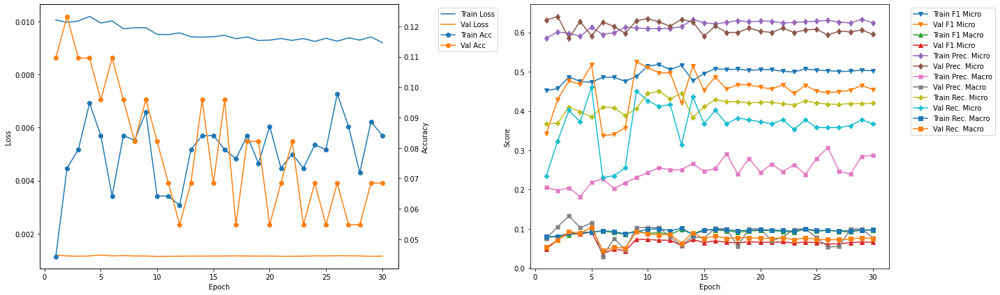

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.01
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0535 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4778 	Validation F1 Micro: 0.4201
Train F1 Marco: 0.0826 	Validation F1 Macro: 0.0803
Train Precision Mirco: 0.6064 	Validation Precision Micro: 0.6262
Train Precision Marco: 0.2107 	Validation Precision Macro: 0.1264
Train Recall Mirco: 0.3942 	Validation Recall Micro: 0.316
Train Recall Marco: 0.0857 	Validation Recall Macro: 0.0783

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.2
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0963 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4488 	Validation F1 Micro: 0.4088
Train F1 Marco: 0.0842 	Validation F1 Macro: 0.0791
Train Precision Mirco: 0.6221 	Validation Precision Micro: 0.6132
Train Precision Marco: 0.1913 	Validation Precision Macro: 0.1115
Train Recall Mirco: 0.351 

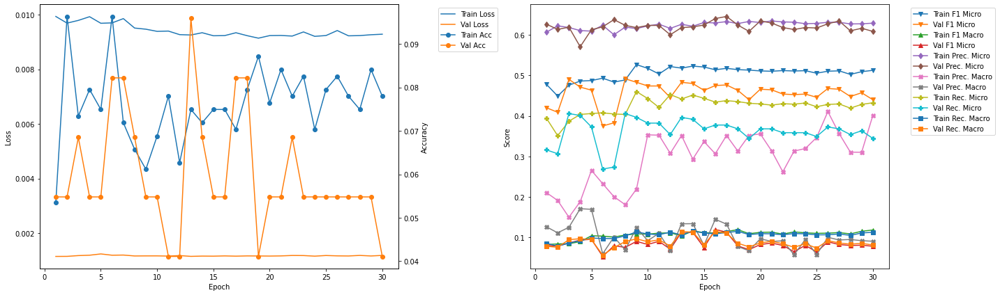

-------------------------------------------
FOLD 6
-------------------------------------------
Validation F1 Micro Score Increased (0.527174 --> 0.536443).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 28.72
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0917 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4696 	Validation F1 Micro: 0.5364
Train F1 Marco: 0.102 	Validation F1 Macro: 0.0931
Train Precision Mirco: 0.6028 	Validation Precision Micro: 0.5897
Train Precision Marco: 0.2134 	Validation Precision Macro: 0.1167
Train Recall Mirco: 0.3847 	Validation Recall Micro: 0.492
Train Recall Marco: 0.0947 	Validation Recall Macro: 0.1069

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.91
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4968 	Validation F1 Micro: 0.5225
Train F1 Marco: 0.1055 	Validation F1 Macro: 0.0977
Train Precision Mirco: 0.623 	Validation Precision Micro: 0.5959
Train Precisi

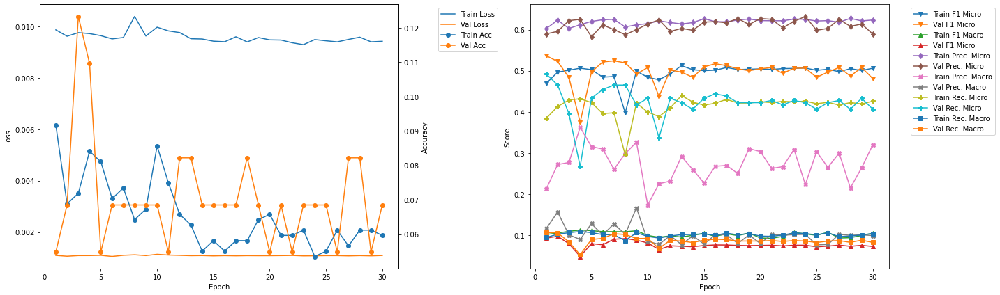

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.41
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4644 	Validation F1 Micro: 0.4825
Train F1 Marco: 0.0901 	Validation F1 Macro: 0.0722
Train Precision Mirco: 0.6166 	Validation Precision Micro: 0.6281
Train Precision Marco: 0.2494 	Validation Precision Macro: 0.1027
Train Recall Mirco: 0.3725 	Validation Recall Micro: 0.3918
Train Recall Marco: 0.087 	Validation Recall Macro: 0.0774

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.6
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4595 	Validation F1 Micro: 0.5272
Train F1 Marco: 0.1024 	Validation F1 Macro: 0.0854
Train Precision Mirco: 0.6054 	Validation Precision Micro: 0.5935
Train Precision Marco: 0.2359 	Validation Precision Macro: 0.1148
Train Recall Mirco: 0.3702

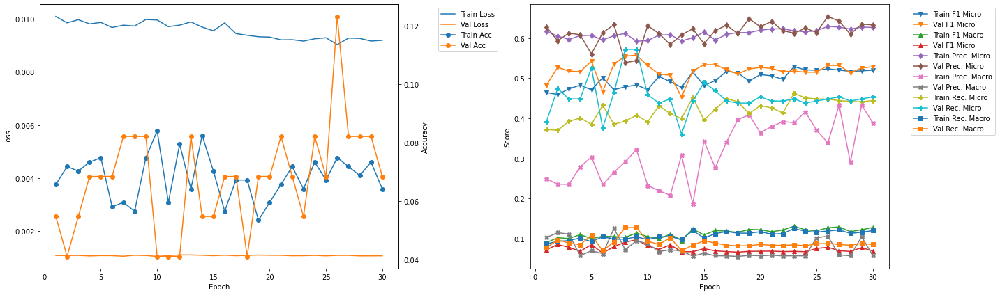

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 40.16
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4863 	Validation F1 Micro: 0.4083
Train F1 Marco: 0.1212 	Validation F1 Macro: 0.1144
Train Precision Mirco: 0.6133 	Validation Precision Micro: 0.5784
Train Precision Marco: 0.3527 	Validation Precision Macro: 0.1266
Train Recall Mirco: 0.4028 	Validation Recall Micro: 0.3155
Train Recall Marco: 0.108 	Validation Recall Macro: 0.115

Epoch 2 	Learning Rate: 0.01 	Time (min): 40.35
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0794 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4943 	Validation F1 Micro: 0.3643
Train F1 Marco: 0.1072 	Validation F1 Macro: 0.0968
Train Precision Mirco: 0.6031 	Validation Precision Micro: 0.5976
Train Precision Marco: 0.3257 	Validation Precision Macro: 0.124
Train Recall Mirco: 0.4188 

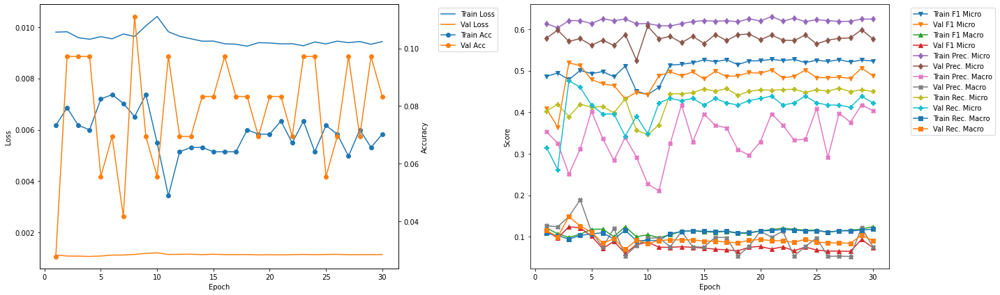

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 45.85
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0702 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.487 	Validation F1 Micro: 0.5363
Train F1 Marco: 0.096 	Validation F1 Macro: 0.1431
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.6439
Train Precision Marco: 0.192 	Validation Precision Macro: 0.2084
Train Recall Mirco: 0.4098 	Validation Recall Micro: 0.4595
Train Recall Marco: 0.0958 	Validation Recall Macro: 0.1397

Epoch 2 	Learning Rate: 0.01 	Time (min): 46.04
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.499 	Validation F1 Micro: 0.4348
Train F1 Marco: 0.1193 	Validation F1 Macro: 0.1104
Train Precision Mirco: 0.6052 	Validation Precision Micro: 0.6593
Train Precision Marco: 0.3755 	Validation Precision Macro: 0.1734
Train Recall Mirco: 0.4245 	Val

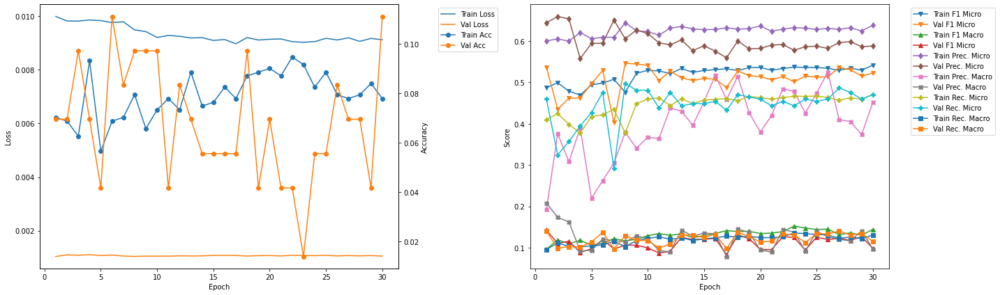

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 51.55
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0794 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.5138 	Validation F1 Micro: 0.5292
Train F1 Marco: 0.1327 	Validation F1 Macro: 0.1331
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.589
Train Precision Marco: 0.3418 	Validation Precision Macro: 0.2205
Train Recall Mirco: 0.4463 	Validation Recall Micro: 0.4804
Train Recall Marco: 0.1225 	Validation Recall Macro: 0.1292

Epoch 2 	Learning Rate: 0.01 	Time (min): 51.74
Train Loss: 0.0095 	Validation Loss: 0.001
Train Accuracy: 0.0885 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4786 	Validation F1 Micro: 0.5568
Train F1 Marco: 0.1293 	Validation F1 Macro: 0.1443
Train Precision Mirco: 0.6289 	Validation Precision Micro: 0.5665
Train Precision Marco: 0.422 	Validation Precision Macro: 0.1727
Train Recall Mirco: 0.3863 

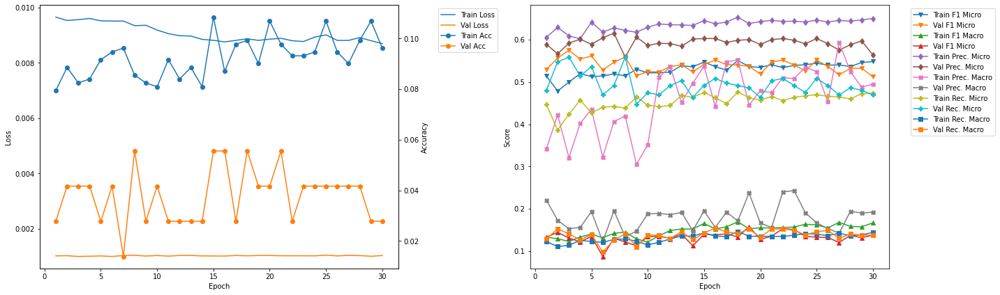

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 10 	Epoch: 3
Train Loss: 0.0096 	Validation Loss: 0.001
Train Accuracy: 0.0824 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4997 	Validation F1 Micro: 0.5747
Train F1 Marco: 0.1227 	Validation F1 Macro: 0.1307
Train Precision Mirco: 0.6089 	Validation Precision Micro: 0.5917
Train Precision Marco: 0.3208 	Validation Precision Macro: 0.1531
Train Recall Mirco: 0.4236 	Validation Recall Micro: 0.5587
Train Recall Marco: 0.1139 	Validation Recall Macro: 0.1409


In [24]:
densenet201LSTM_700_1_50_best = Kfold_train_CNN_RNN(model = densenet201LSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet201LSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.19
Train Loss: 0.0179 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0628 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0401 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1481 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0898 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0398 	Validation Recall Micro: 0.0
Train Recall Marco: 0.053 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.38
Train Loss: 0.0116 	Validation Loss: 0.0013
Train Accuracy: 0.0183 	Validation Accuracy: 0.0
Train F1 Mirco: 0.3049 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0474 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5254 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0478 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.2148 	Validation Recall Micro: 0.0
Train Rec

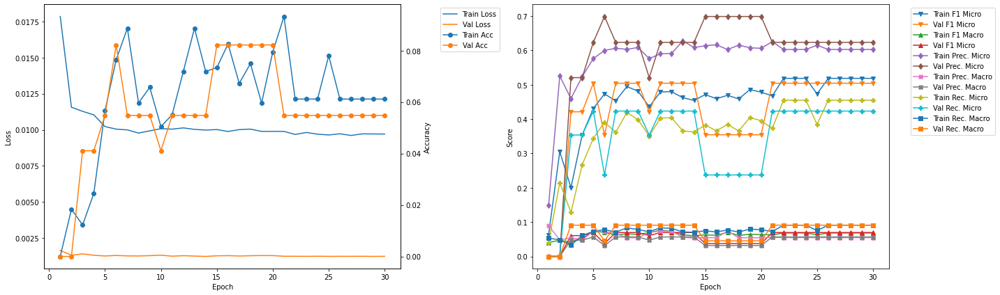

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.9
Train Loss: 0.0126 	Validation Loss: 0.0012
Train Accuracy: 0.0183 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2519 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0493 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4942 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0802 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.169 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0415 	Validation Recall Macro: 0.0

Validation F1 Micro Score Increased (0.504155 --> 0.581907).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.12
Train Loss: 0.0108 	Validation Loss: 0.0011
Train Accuracy: 0.0229 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.3245 	Validation F1 Micro: 0.5819
Train F1 Marco: 0.0591 	Validation F1 Macro: 0.0944
Train Precision Mirco: 0.5512 	Validation Precision Micro: 0.5434
Train Precision Marco: 0.0733 	Vali

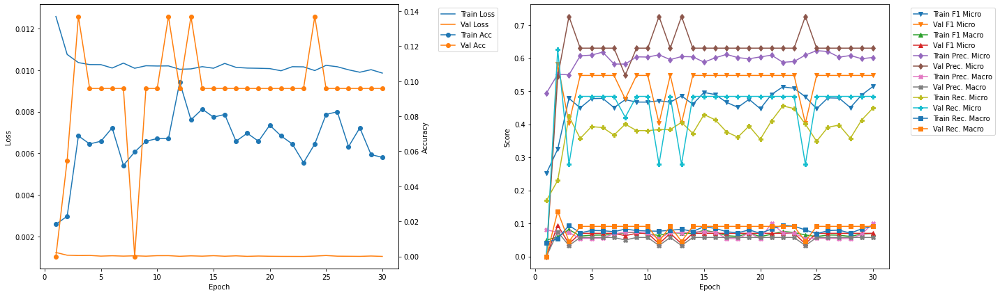

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.59
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4512 	Validation F1 Micro: 0.5207
Train F1 Marco: 0.0637 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.6089 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0724 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.3584 	Validation Recall Micro: 0.4583
Train Recall Marco: 0.071 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.78
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4974 	Validation F1 Micro: 0.5207
Train F1 Marco: 0.0744 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.5821 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0701 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.4342 	V

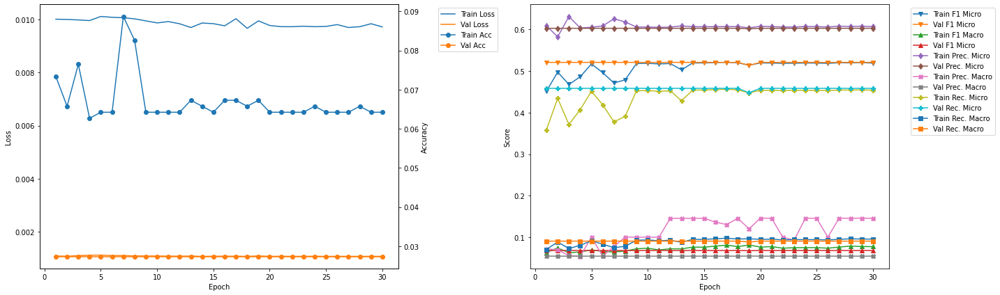

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.25
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4823 	Validation F1 Micro: 0.3941
Train F1 Marco: 0.0724 	Validation F1 Macro: 0.0578
Train Precision Mirco: 0.5985 	Validation Precision Micro: 0.7067
Train Precision Marco: 0.1432 	Validation Precision Macro: 0.1227
Train Recall Mirco: 0.4039 	Validation Recall Micro: 0.2732
Train Recall Marco: 0.0825 	Validation Recall Macro: 0.057

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.44
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4887 	Validation F1 Micro: 0.382
Train F1 Marco: 0.0695 	Validation F1 Macro: 0.0374
Train Precision Mirco: 0.6228 	Validation Precision Micro: 0.6986
Train Precision Marco: 0.1013 	Validation Precision Macro: 0.0318
Train Recall Mirco: 0.4022 	V

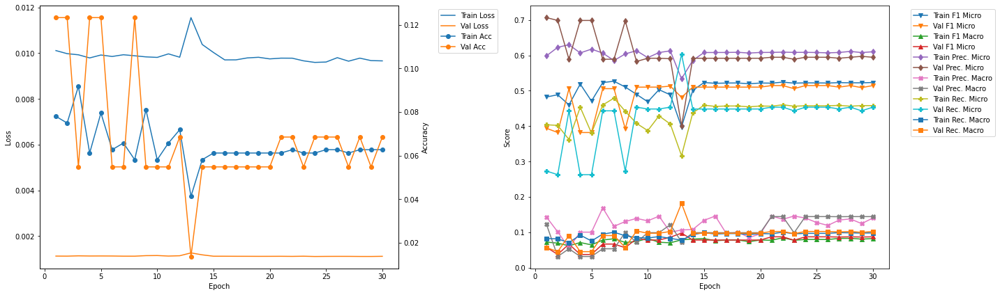

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.92
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0642 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4705 	Validation F1 Micro: 0.5612
Train F1 Marco: 0.0707 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.5965 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.1017 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.3885 	Validation Recall Micro: 0.4974
Train Recall Marco: 0.0799 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.11
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5127 	Validation F1 Micro: 0.5612
Train F1 Marco: 0.0707 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.6009 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.1455 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.4471

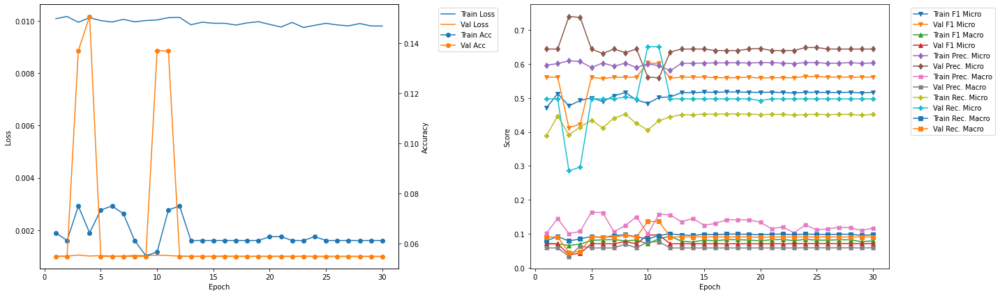

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.61
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0749 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4742 	Validation F1 Micro: 0.5407
Train F1 Marco: 0.0767 	Validation F1 Macro: 0.0707
Train Precision Mirco: 0.6009 	Validation Precision Micro: 0.637
Train Precision Marco: 0.1475 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.3917 	Validation Recall Micro: 0.4697
Train Recall Marco: 0.0834 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.8
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0826 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5191 	Validation F1 Micro: 0.3469
Train F1 Marco: 0.0861 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.5934 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.1196 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.4614 	V

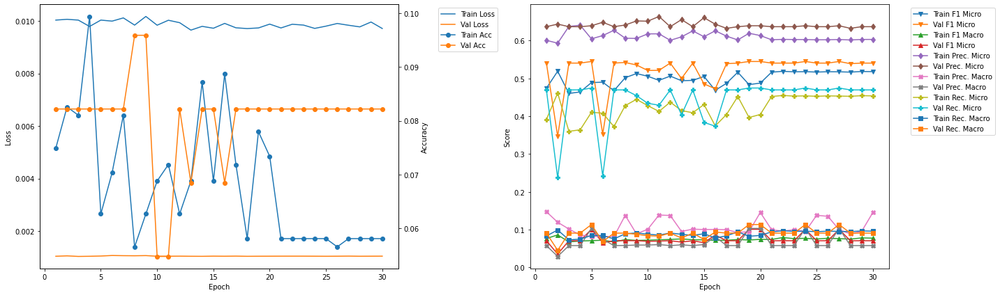

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.28
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0826 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.491 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.073 	Validation F1 Macro: 0.0665
Train Precision Mirco: 0.6279 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.1304 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4031 	Validation Recall Micro: 0.4404
Train Recall Marco: 0.0828 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.46
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5218 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0786 	Validation F1 Macro: 0.0665
Train Precision Mirco: 0.6076 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.126 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4572 

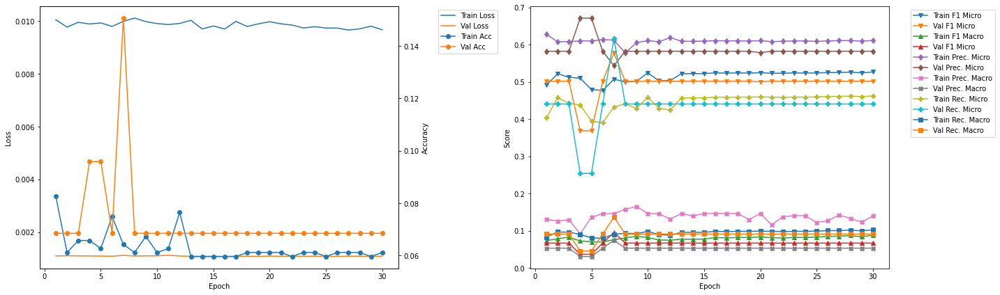

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.94
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0672 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4962 	Validation F1 Micro: 0.4854
Train F1 Marco: 0.0804 	Validation F1 Macro: 0.0809
Train Precision Mirco: 0.6173 	Validation Precision Micro: 0.5724
Train Precision Marco: 0.1363 	Validation Precision Macro: 0.0972
Train Recall Mirco: 0.4149 	Validation Recall Micro: 0.4213
Train Recall Marco: 0.0891 	Validation Recall Macro: 0.1

Epoch 2 	Learning Rate: 0.01 	Time (min): 40.13
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0611 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.528 	Validation F1 Micro: 0.484
Train F1 Marco: 0.0865 	Validation F1 Macro: 0.0809
Train Precision Mirco: 0.6124 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.1424 	Validation Precision Macro: 0.0972
Train Recall Mirco: 0.464 	Va

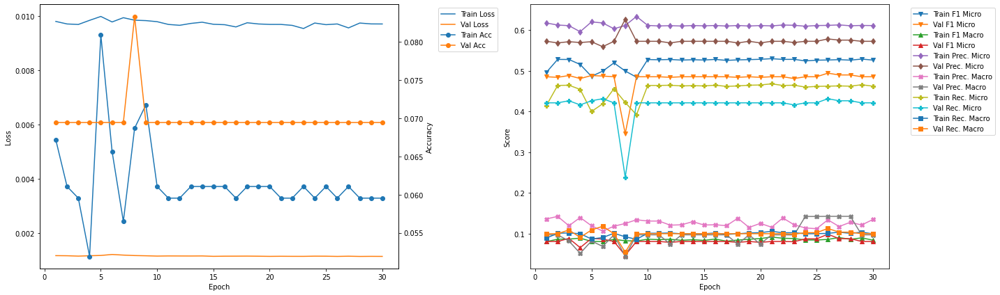

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 45.6
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5124 	Validation F1 Micro: 0.5152
Train F1 Marco: 0.0805 	Validation F1 Macro: 0.1124
Train Precision Mirco: 0.6177 	Validation Precision Micro: 0.5629
Train Precision Marco: 0.1326 	Validation Precision Macro: 0.1149
Train Recall Mirco: 0.4378 	Validation Recall Micro: 0.4749
Train Recall Marco: 0.0938 	Validation Recall Macro: 0.1288

Epoch 2 	Learning Rate: 0.01 	Time (min): 45.79
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5219 	Validation F1 Micro: 0.5046
Train F1 Marco: 0.0763 	Validation F1 Macro: 0.0876
Train Precision Mirco: 0.6112 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.1236 	Validation Precision Macro: 0.096
Train Recall Mirco: 0.4553 	

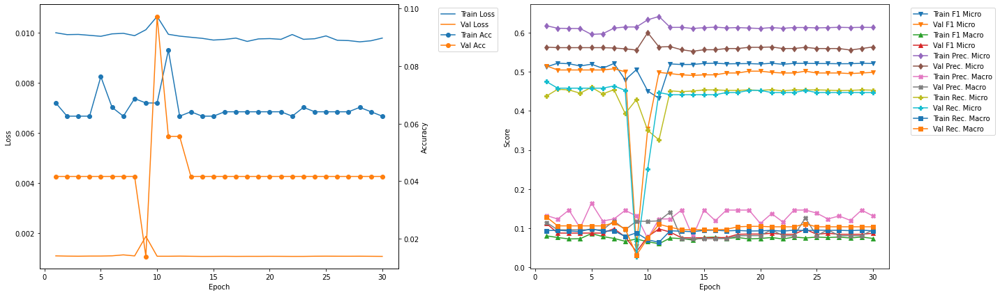

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 51.26
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4867 	Validation F1 Micro: 0.5376
Train F1 Marco: 0.0742 	Validation F1 Macro: 0.1045
Train Precision Mirco: 0.6156 	Validation Precision Micro: 0.637
Train Precision Marco: 0.1457 	Validation Precision Macro: 0.1476
Train Recall Mirco: 0.4024 	Validation Recall Micro: 0.465
Train Recall Marco: 0.0838 	Validation Recall Macro: 0.1124

Epoch 2 	Learning Rate: 0.01 	Time (min): 51.45
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0794 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4591 	Validation F1 Micro: 0.5402
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.1088
Train Precision Mirco: 0.6246 	Validation Precision Micro: 0.6351
Train Precision Marco: 0.1457 	Validation Precision Macro: 0.1472
Train Recall Mirco: 0.362

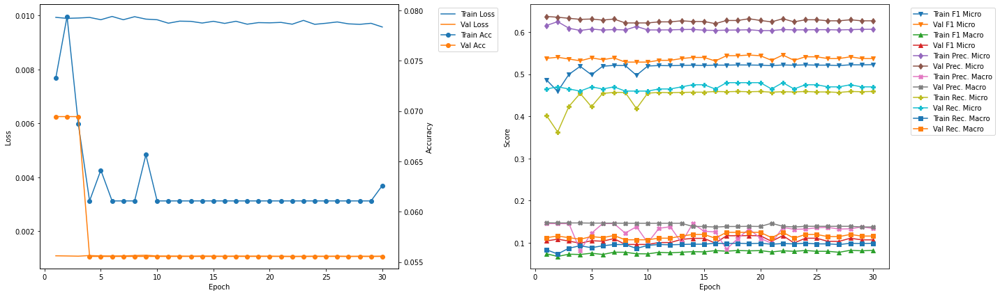

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 5 	Epoch: 10
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0566 	Validation Accuracy: 0.137
Train F1 Mirco: 0.484 	Validation F1 Micro: 0.6029
Train F1 Marco: 0.0708 	Validation F1 Macro: 0.0967
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0998 	Validation Precision Macro: 0.0766
Train Recall Mirco: 0.4056 	Validation Recall Micro: 0.6508
Train Recall Marco: 0.085 	Validation Recall Macro: 0.1364


In [25]:
vgg11bnLSTM_700_1_50_best = Kfold_train_CNN_RNN(model = vgg11bnLSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg11bnLSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.2
Train Loss: 0.0164 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0496 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0316 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.119 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1195 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0313 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0225 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.41
Train Loss: 0.0127 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

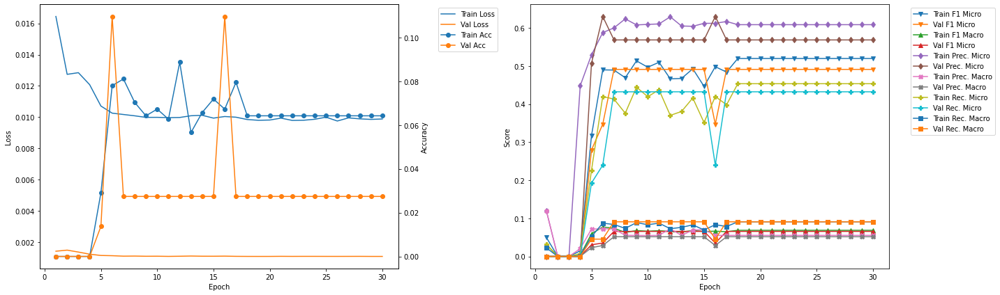

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.491124 --> 0.501441).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 6.41
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4514 	Validation F1 Micro: 0.5014
Train F1 Marco: 0.0645 	Validation F1 Macro: 0.0676
Train Precision Mirco: 0.5902 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0709 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.3654 	Validation Recall Micro: 0.4328
Train Recall Marco: 0.0725 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.61
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0566 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.459 	Validation F1 Micro: 0.3577
Train F1 Marco: 0.0712 	Validation F1 Macro: 0.0365
Train Precision Mirco: 0.5841 	Validation Precision Micro: 0.6712
Train Precision

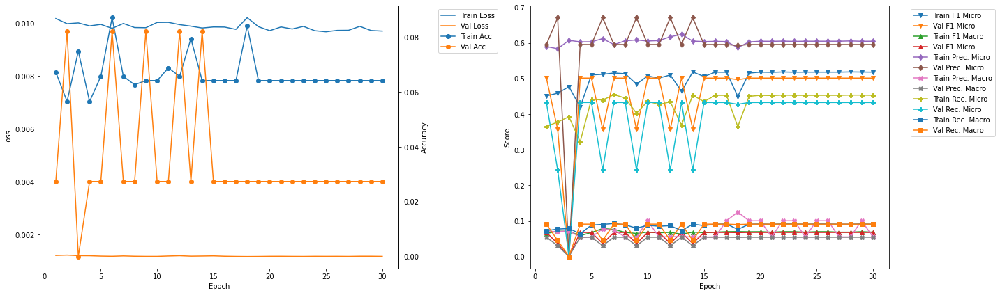

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.501441 --> 0.562874).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 12.51
Train Loss: 0.0103 	Validation Loss: 0.001
Train Accuracy: 0.0489 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4762 	Validation F1 Micro: 0.5629
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.0709
Train Precision Mirco: 0.5865 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.4008 	Validation Recall Micro: 0.5
Train Recall Marco: 0.0818 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.71
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0856 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4665 	Validation F1 Micro: 0.5629
Train F1 Marco: 0.0632 	Validation F1 Macro: 0.0709
Train Precision Mirco: 0.621 	Validation Precision Micro: 0.6438
Train Precision 

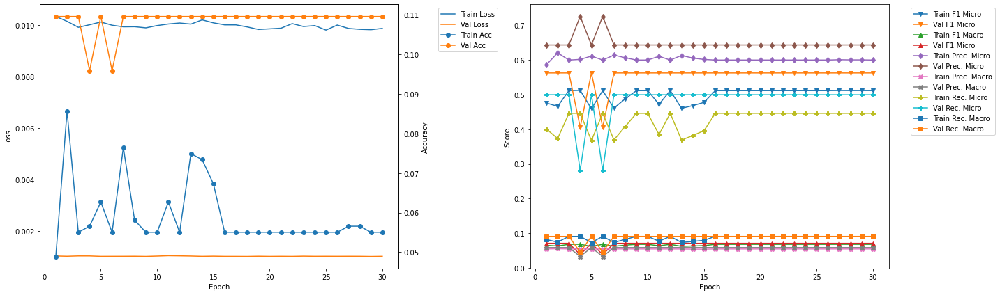

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.58
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4795 	Validation F1 Micro: 0.5367
Train F1 Marco: 0.0641 	Validation F1 Macro: 0.0716
Train Precision Mirco: 0.6058 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.3968 	Validation Recall Micro: 0.4567
Train Recall Marco: 0.0787 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.78
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0795 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4748 	Validation F1 Micro: 0.3559
Train F1 Marco: 0.0638 	Validation F1 Macro: 0.037
Train Precision Mirco: 0.62 	Validation Precision Micro: 0.6849
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0311
Train Recall Mirco: 0.3847 	V

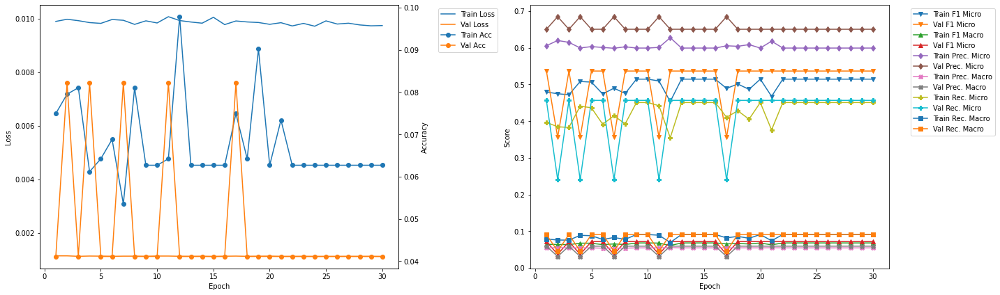

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.7
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4794 	Validation F1 Micro: 0.5169
Train F1 Marco: 0.0641 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.6155 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.3926 	Validation Recall Micro: 0.4381
Train Recall Marco: 0.0773 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.9
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5169 	Validation F1 Micro: 0.5169
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.6017 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.4531 	

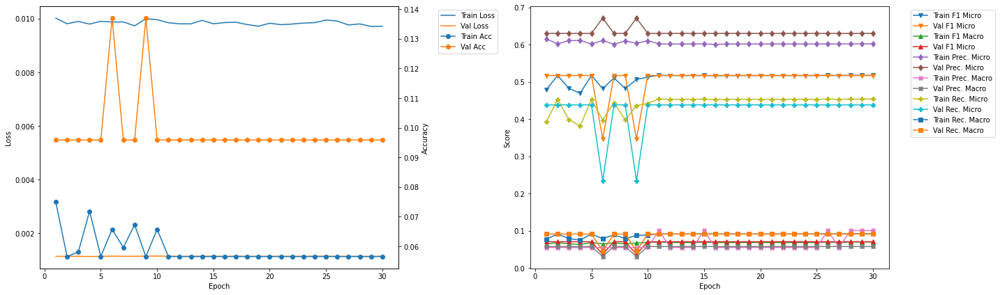

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.77
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0657 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4899 	Validation F1 Micro: 0.5357
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6166 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4064 	Validation Recall Micro: 0.4737
Train Recall Marco: 0.0813 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.97
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5148 	Validation F1 Micro: 0.5357
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4491 	

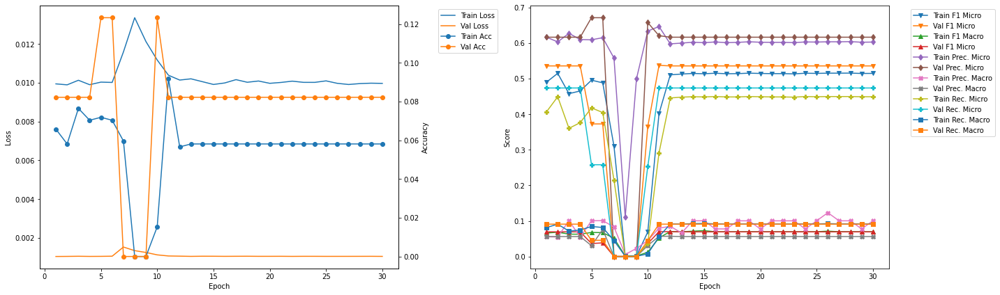

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.84
Train Loss: 0.0111 	Validation Loss: 0.0012
Train Accuracy: 0.0826 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4334 	Validation F1 Micro: 0.3308
Train F1 Marco: 0.0687 	Validation F1 Macro: 0.0337
Train Precision Mirco: 0.5966 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0739 	Validation Precision Macro: 0.0268
Train Recall Mirco: 0.3403 	Validation Recall Micro: 0.2299
Train Recall Marco: 0.069 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.04
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0902 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4711 	Validation F1 Micro: 0.4685
Train F1 Marco: 0.0646 	Validation F1 Macro: 0.0632
Train Precision Mirco: 0.6349 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0793 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.3744

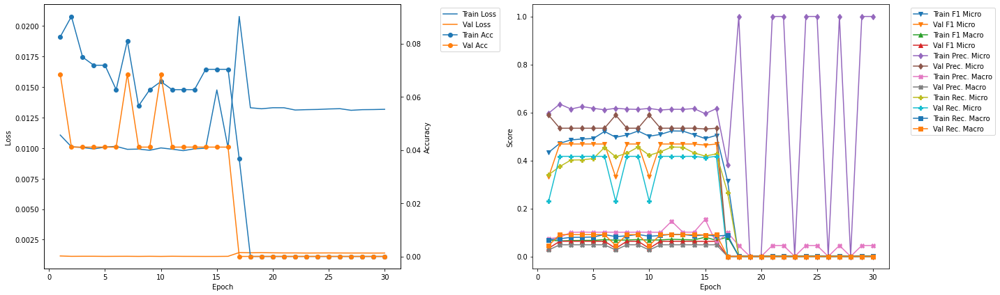

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.91
Train Loss: 0.0138 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 43.12
Train Loss: 0.0132 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0012 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0227 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0006 	Va

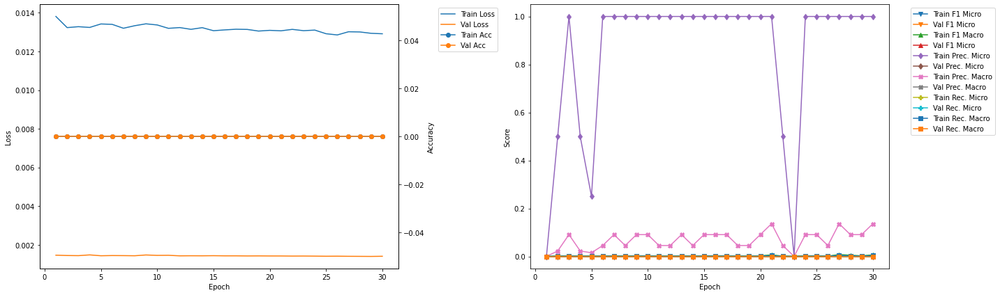

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 48.98
Train Loss: 0.0136 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0023 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0027 	Validation F1 Macro: 0.0
Train Precision Mirco: 1.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0455 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0014 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 49.19
Train Loss: 0.013 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0034 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0068 	Validation F1 Macro: 0.0
Train Precision Mirco: 1.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1364 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0017 	Validation Recall Micro: 0.0
Train Recall Mar

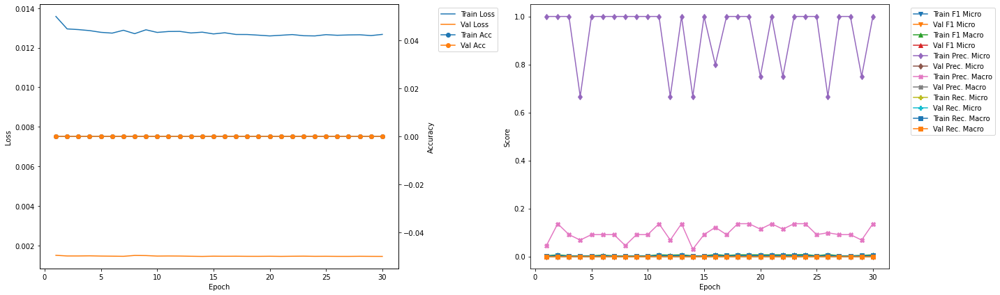

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 55.04
Train Loss: 0.0133 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0406 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0172 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.3619 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1556 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0215 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0102 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 55.25
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0023 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0027 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.6667 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0682 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0
Train Re

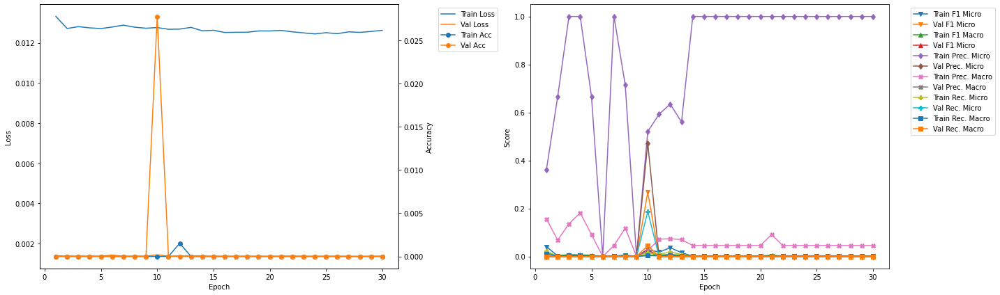

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 3 	Epoch: 1
Train Loss: 0.0103 	Validation Loss: 0.001
Train Accuracy: 0.0489 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4762 	Validation F1 Micro: 0.5629
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.0709
Train Precision Mirco: 0.5865 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.4008 	Validation Recall Micro: 0.5
Train Recall Marco: 0.0818 	Validation Recall Macro: 0.0909


In [26]:
vgg16bnLSTM_700_1_50_best = Kfold_train_CNN_RNN(model = vgg16bnLSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg16bnLSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.21
Train Loss: 0.0183 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0995 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0601 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1251 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1205 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0826 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0712 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.42
Train Loss: 0.0132 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

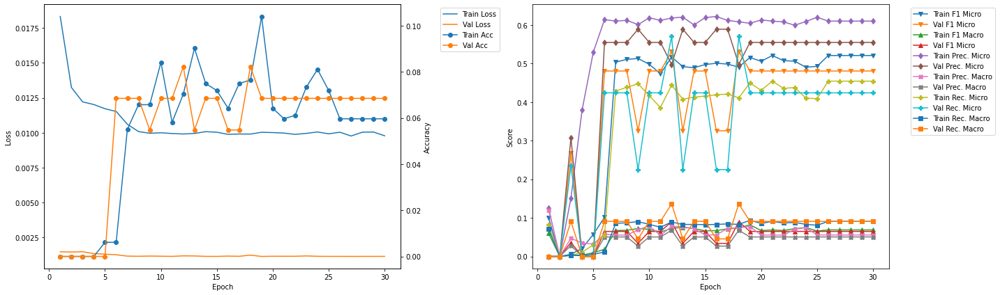

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.56
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0719 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4672 	Validation F1 Micro: 0.4941
Train F1 Marco: 0.0713 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.5872 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.071 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.3879 	Validation Recall Micro: 0.433
Train Recall Marco: 0.0782 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.77
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0749 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4732 	Validation F1 Micro: 0.4941
Train F1 Marco: 0.0633 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.6196 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.3828 	Valid

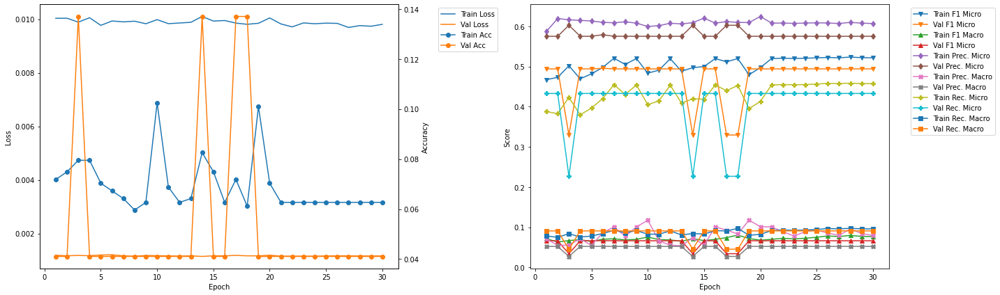

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.531707 --> 0.563218).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 12.87
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.499 	Validation F1 Micro: 0.5632
Train F1 Marco: 0.0768 	Validation F1 Macro: 0.0727
Train Precision Mirco: 0.5937 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.1087 	Validation Precision Macro: 0.061
Train Recall Mirco: 0.4304 	Validation Recall Micro: 0.4851
Train Recall Marco: 0.0913 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.08
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4554 	Validation F1 Micro: 0.5632
Train F1 Marco: 0.0649 	Validation F1 Macro: 0.0727
Train Precision Mirco: 0.6036 	Validation Precision Micro: 0.6712
Train Precis

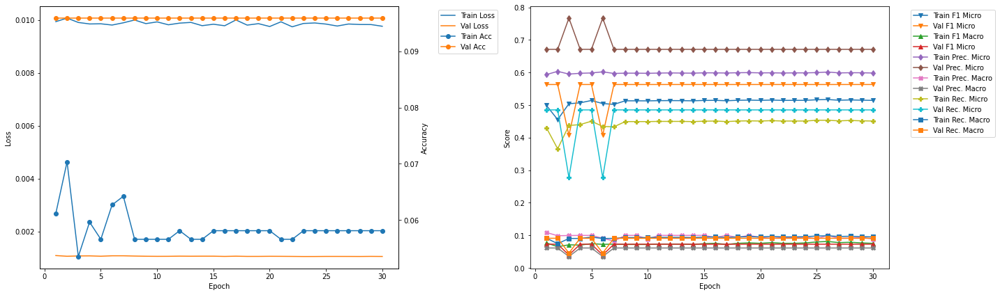

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.563218 --> 0.588571).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 19.18
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0627 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4977 	Validation F1 Micro: 0.5886
Train F1 Marco: 0.0722 	Validation F1 Macro: 0.0929
Train Precision Mirco: 0.5938 	Validation Precision Micro: 0.7007
Train Precision Marco: 0.0724 	Validation Precision Macro: 0.109
Train Recall Mirco: 0.4283 	Validation Recall Micro: 0.5074
Train Recall Marco: 0.0881 	Validation Recall Macro: 0.1023

Validation F1 Micro Score Increased (0.588571 --> 0.590258).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.41
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0627 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5041 	Validation F1 Micro: 0.5903
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0931
T

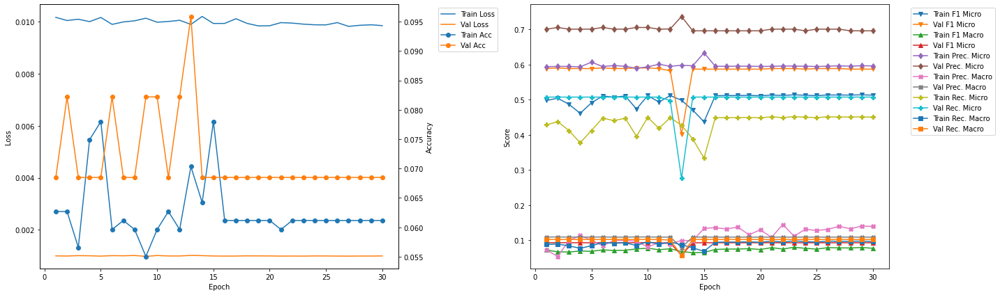

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.5
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5187 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0839 	Validation F1 Macro: 0.0659
Train Precision Mirco: 0.6064 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.1296 	Validation Precision Macro: 0.0517
Train Recall Mirco: 0.4532 	Validation Recall Micro: 0.4462
Train Recall Marco: 0.0983 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.7
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4852 	Validation F1 Micro: 0.497
Train F1 Marco: 0.0725 	Validation F1 Macro: 0.0659
Train Precision Mirco: 0.6254 	Validation Precision Micro: 0.5608
Train Precision Marco: 0.1391 	Validation Precision Macro: 0.0517
Train Recall Mirco: 0.3964 	Va

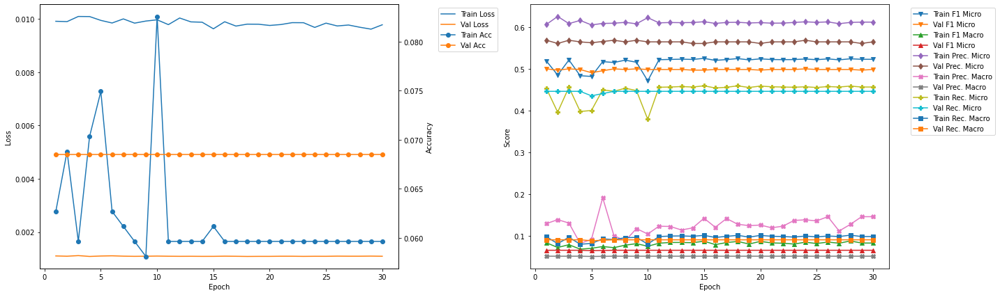

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.79
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0719 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4939 	Validation F1 Micro: 0.5141
Train F1 Marco: 0.0747 	Validation F1 Macro: 0.065
Train Precision Mirco: 0.6151 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.095 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4126 	Validation Recall Micro: 0.474
Train Recall Marco: 0.0867 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.99
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5191 	Validation F1 Micro: 0.5141
Train F1 Marco: 0.0763 	Validation F1 Macro: 0.065
Train Precision Mirco: 0.6105 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.1387 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4515 	Vali

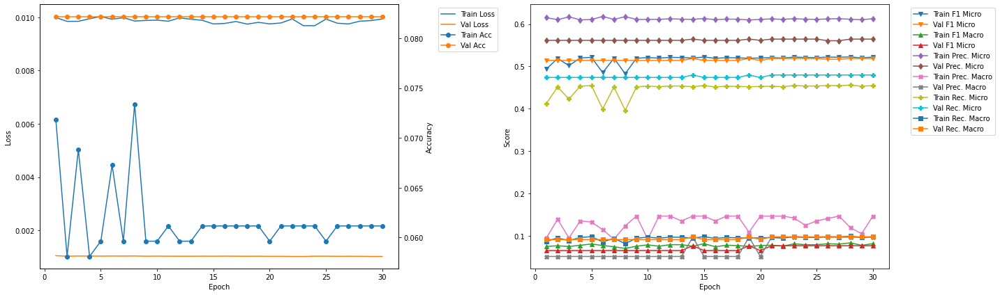

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.08
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4983 	Validation F1 Micro: 0.5254
Train F1 Marco: 0.0782 	Validation F1 Macro: 0.0806
Train Precision Mirco: 0.6044 	Validation Precision Micro: 0.6284
Train Precision Marco: 0.1168 	Validation Precision Macro: 0.0804
Train Recall Mirco: 0.4239 	Validation Recall Micro: 0.4515
Train Recall Marco: 0.0902 	Validation Recall Macro: 0.0974

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.29
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5225 	Validation F1 Micro: 0.5311
Train F1 Marco: 0.0866 	Validation F1 Macro: 0.0885
Train Precision Mirco: 0.6045 	Validation Precision Micro: 0.6351
Train Precision Marco: 0.1171 	Validation Precision Macro: 0.1035
Train Recall Mirco: 0.46

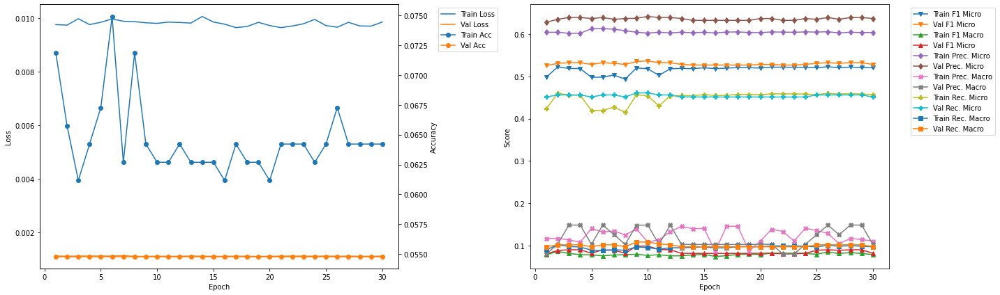

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.37
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.084 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.499 	Validation F1 Micro: 0.4802
Train F1 Marco: 0.0777 	Validation F1 Macro: 0.0877
Train Precision Mirco: 0.6203 	Validation Precision Micro: 0.5705
Train Precision Marco: 0.0881 	Validation Precision Macro: 0.1157
Train Recall Mirco: 0.4173 	Validation Recall Micro: 0.4146
Train Recall Marco: 0.0881 	Validation Recall Macro: 0.1048

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.58
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0672 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.525 	Validation F1 Micro: 0.4743
Train F1 Marco: 0.0775 	Validation F1 Macro: 0.0739
Train Precision Mirco: 0.6097 	Validation Precision Micro: 0.5724
Train Precision Marco: 0.0907 	Validation Precision Macro: 0.0748
Train Recall Mirco: 0.461 	Va

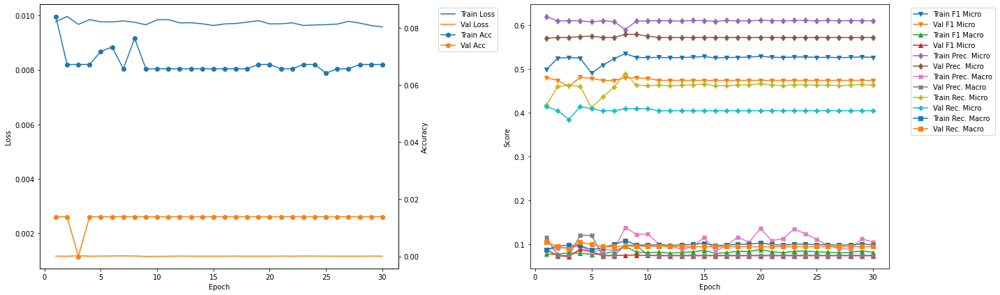

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 50.66
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0779 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4929 	Validation F1 Micro: 0.538
Train F1 Marco: 0.0748 	Validation F1 Macro: 0.0991
Train Precision Mirco: 0.6074 	Validation Precision Micro: 0.6216
Train Precision Marco: 0.0826 	Validation Precision Macro: 0.0922
Train Recall Mirco: 0.4147 	Validation Recall Micro: 0.4742
Train Recall Marco: 0.0873 	Validation Recall Macro: 0.1169

Epoch 2 	Learning Rate: 0.01 	Time (min): 50.87
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5194 	Validation F1 Micro: 0.538
Train F1 Marco: 0.077 	Validation F1 Macro: 0.0991
Train Precision Mirco: 0.6045 	Validation Precision Micro: 0.6216
Train Precision Marco: 0.1117 	Validation Precision Macro: 0.0922
Train Recall Mirco: 0.4552 	V

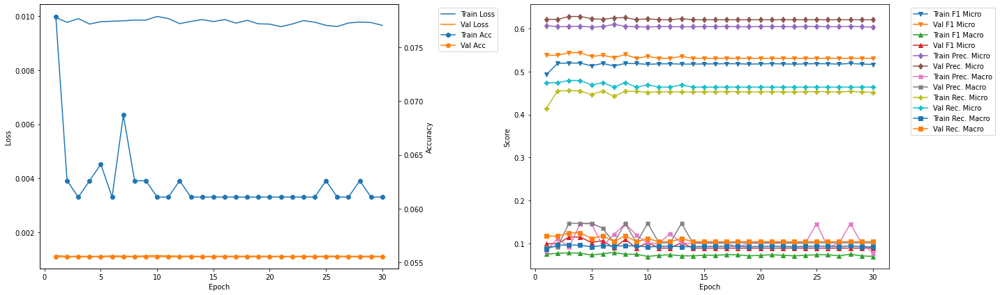

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 56.95
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0641 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5035 	Validation F1 Micro: 0.5104
Train F1 Marco: 0.0723 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6076 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.1003 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4299 	Validation Recall Micro: 0.4456
Train Recall Marco: 0.0884 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 57.16
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5191 	Validation F1 Micro: 0.5104
Train F1 Marco: 0.0726 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6062 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.1005 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4

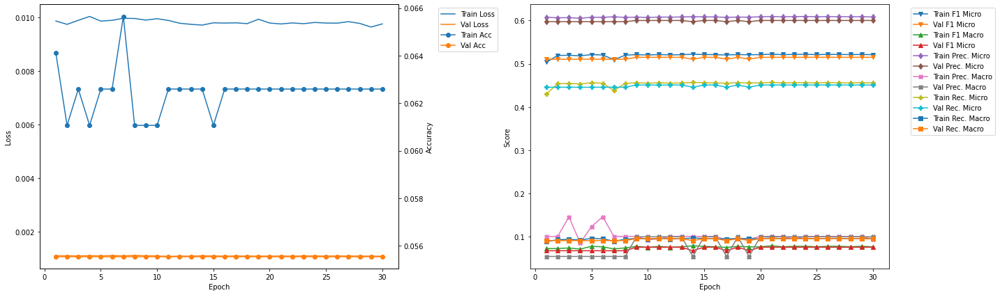

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 2
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0627 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5041 	Validation F1 Micro: 0.5903
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0931
Train Precision Mirco: 0.5947 	Validation Precision Micro: 0.7055
Train Precision Marco: 0.054 	Validation Precision Macro: 0.1094
Train Recall Mirco: 0.4375 	Validation Recall Micro: 0.5074
Train Recall Marco: 0.0891 	Validation Recall Macro: 0.1023


In [27]:
vgg19bnLSTM_700_1_50_best = Kfold_train_CNN_RNN(model = vgg19bnLSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg19bnLSTM_700_1_50')

In [28]:
print('Total Training Time (HR:M:S): ' + str(datetime.timedelta(hours = ((time.time() - START) / 60 / 60))).rsplit('.', 1)[0])

Total Training Time (HR:M:S): 7:45:52


## Training Summary

### Summary Table

In [29]:
summaryDF = pd.DataFrame({
    'ResNet18' : resnet18LSTM_700_1_50_best,
    'ResNet50' : resnet50LSTM_700_1_50_best,
    'ResNet101' : resnet101LSTM_700_1_50_best,
    'DenseNet121' : densenet121LSTM_700_1_50_best,
    'DenseNet169' : densenet169LSTM_700_1_50_best,
    'DenseNet201' : densenet201LSTM_700_1_50_best,
    'VGG11_BN' : vgg11bnLSTM_700_1_50_best,
    'VGG16_BN' : vgg16bnLSTM_700_1_50_best,
    'VGG19_BN' : vgg19bnLSTM_700_1_50_best
})
summaryDF.index = ['Fold', 'Epoch', 'Train Loss', 'Train Accuracy', 'Train F1 Micro', 'Train F1 Macro', 'Train Precision Micro', 'Train Precision Macro', 'Train Recall Micro', 'Train Recall Macro',
                   'Val Loss', 'Val Accuracy', 'Val F1 Micro', 'Val F1 Macro', 'Val Precision Micro', 'Val Precision Macro', 'Val Recall Micro', 'Val Recall Macro']

summaryDF

,ResNet18,ResNet50,ResNet101,DenseNet121,DenseNet169,DenseNet201,VGG11_BN,VGG16_BN,VGG19_BN
Fold,3.000000,2.000000,3.000000,7.000000,10.000000,10.000000,5.000000,3.000000,4.000000
Epoch,3.000000,3.000000,5.000000,2.000000,3.000000,3.000000,10.000000,1.000000,2.000000
Train Loss,0.010095,0.010200,0.010559,0.009899,0.009220,0.009564,0.010036,0.010330,0.010045
Train Accuracy,0.064220,0.084098,0.061162,0.062691,0.082443,0.082443,0.056575,0.048930,0.062691
Train F1 Micro,0.441997,0.429963,0.328222,0.444527,0.531345,0.499666,0.484046,0.476190,0.504130
Train F1 Macro,0.060821,0.061569,0.050611,0.135376,0.168939,0.122689,0.070786,0.065160,0.067079
Train Precision Micro,0.612411,0.612593,0.605505,0.617526,0.657718,0.608943,0.600168,0.586522,0.594700
Train Precision Macro,0.054605,0.070331,0.074153,0.375098,0.532612,0.320849,0.099795,0.054448,0.053950
Train Recall Micro,0.345778,0.331218,0.225128,0.347246,0.445708,0.423643,0.405575,0.400796,0.437500
Train Recall Macro,0.068855,0.065071,0.045318,0.113185,0.143115,0.113879,0.084955,0.081785,0.089075


### Training Summary Graph

In [30]:
import plotly
import plotly.graph_objects as go

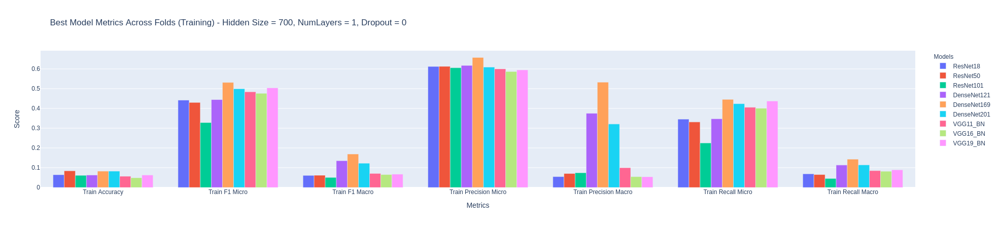

In [31]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[3:10], y = summaryDF['ResNet18'][3:10]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[3:10], y = summaryDF['ResNet50'][3:10]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[3:10], y = summaryDF['ResNet101'][3:10]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[3:10], y = summaryDF['DenseNet121'][3:10]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[3:10], y = summaryDF['DenseNet169'][3:10]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[3:10], y = summaryDF['DenseNet201'][3:10]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[3:10], y = summaryDF['VGG11_BN'][3:10]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[3:10], y = summaryDF['VGG16_BN'][3:10]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[3:10], y = summaryDF['VGG19_BN'][3:10]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Training) - Hidden Size = 700, NumLayers = 1, Dropout = 0',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()

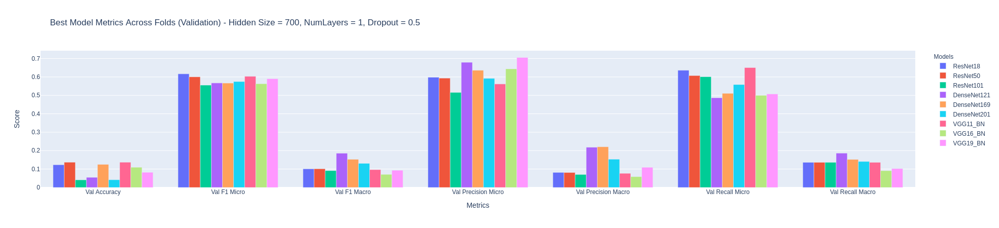

In [32]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[11:], y = summaryDF['ResNet18'][11:]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[11:], y = summaryDF['ResNet50'][11:]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[11:], y = summaryDF['ResNet101'][11:]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[11:], y = summaryDF['DenseNet121'][11:]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[11:], y = summaryDF['DenseNet169'][11:]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[11:], y = summaryDF['DenseNet201'][11:]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[11:], y = summaryDF['VGG11_BN'][11:]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[11:], y = summaryDF['VGG16_BN'][11:]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[11:], y = summaryDF['VGG19_BN'][11:]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Validation) - Hidden Size = 700, NumLayers = 1, Dropout = 0.5',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()